## Capstone Project Submission by Nitin Balaji Srinivasan, Cohort 58 - AI and ML

## Sentiment Based Product Recommendation System

### Problem Statement & Objective

Ebuss has captured a huge market share in many fields, and it sells the products in various categories such as household essentials, books, personal care products, medicines, cosmetic items, beauty products, electrical appliances, kitchen and dining products and health care products.


With the advancement in technology, it is imperative for Ebuss to grow quickly in the e-commerce market to become a major leader in the market because it has to compete with the likes of Amazon, Flipkart, etc., which are already market leaders.


Therefore it is required to build a model that will improve the recommendations given to the users given their past reviews and ratings.


We need to build a sentiment-based product recommendation system, which includes the following tasks.

 - Data sourcing and sentiment analysis
 - Building a recommendation system
 - Improving the recommendations using the sentiment analysis model
 - Deploying the end-to-end project with a user interface

### Approach and High level steps:

#### 1. Data sourcing and sentiment analysis
In this task, we have to analyse product reviews after some text preprocessing steps and build a ML model to get the sentiments corresponding to the users' reviews and ratings for multiple products.

The Product Reviews Dataset consists of 30,000 reviews for more than 200 different products. The reviews and ratings are given by more than 20,000 users.


The steps to be performed for the first task are given below.

    1) Exploratory data analysis

    2) Data cleaning

    3) Text preprocessing

    4) Feature extraction: In order to extract features from the text data, we may choose from any of the methods, including bag-of-words, TF-IDF vectorization or word embedding.

    5) Training a text classification model: We need to build at least three ML models. We need to analyse the performance of each of these models and choose the best model. At least three out of the following four models need to be built (incl.handling the class imbalance and hyperparameter tuning if required).
      1. Logistic regression
      2. Random forest
      3. XGBoost
      4. Naive Bayes

    Out of these four models, you need to select one classification model based on its performance.

#### 2. Building a recommendation system
We can use the following types of recommendation systems.

1. User-based recommendation system

2. Item-based recommendation system


We should analyse the recommendation systems and select the one that is best suited in this case.

Once we get the best-suited recommendation system, the next task is to recommend 20 products that a user is most likely to purchase based on the ratings.  We can use the 'reviews_username' (one of the columns in the dataset) to identify the user.

#### 3. Improving the recommendations using the sentiment analysis model
Now, the next task is to link this recommendation system with the sentiment analysis model that was built earlier (recall that we asked you to select one ML model out of the four options). Once we recommend 20 products to a particular user using the recommendation engine, we need to filter out the 5 best products based on the sentiments of the 20 recommended product reviews.

In this way, we will get an ML model (for sentiments) and the best-suited recommendation system.


#### 4. Deployment of this end to end project with a user interface
Once we get the ML model and the best-suited recommendation system, we will deploy the end-to-end project. We need to use the Flask framework, which is majorly used to create web applications to deploy machine learning models.



To make the web application public, we need to use Heroku, which works as the platform as a service (PaaS) that helps developers build, run and operate applications entirely on the cloud.



Next, we need to include the following features in the user interface.

 - Take any of the existing usernames as input.
 - Create a submit button to submit the username.
 - Once you press the submit button, it should recommend 5 products based on the entered username.

### Assumptions

 - 1. The number of users and the number of products are fixed in this case study, and we are doing the sentiment analysis and building the recommendation system only for those users who have already submitted the reviews or ratings corresponding to some of the products in the dataset.
 - 2. No new users or products will be introduced or considered when building or predicting from the models built.

#### Importing all the required libraries

In [3]:
# Mounting the google drive:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
import json
import numpy as np
import pandas as pd
import re, nltk, spacy, string
import en_core_web_sm
nlp_model1 = en_core_web_sm.load()
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

!pip install pycrf
!pip install sklearn-crfsuite

import spacy
import os
import sklearn_crfsuite
from sklearn_crfsuite import metrics

nlp_model2 = spacy.load("en_core_web_sm")

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px

import string
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
# To download the stopwords from NLTK library
import nltk
nltk.download('stopwords')
from wordcloud import WordCloud ,STOPWORDS

from nltk.corpus import stopwords
import nltk
nltk.download('punkt_tab')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
stopword_list= stopwords.words('english')


from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from pprint import pprint


from collections import Counter
!pip install imblearn
from imblearn.over_sampling import SMOTE

from sklearn.metrics import classification_report,roc_auc_score,confusion_matrix,f1_score,precision_score,accuracy_score,recall_score
from sklearn.metrics import pairwise_distances

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
import xgboost as xgb
from xgboost import XGBClassifier


from sklearn.model_selection import train_test_split,StratifiedKFold, GridSearchCV,RandomizedSearchCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

import pickle

import warnings
warnings.filterwarnings('ignore')

  Preparing metadata (setup.py) ... done
  Created wheel for pycrf: filename=pycrf-0.0.1-py3-none-any.whl size=1871 sha256=9a22b098f5cb7d981ca26bb2f404f85b57c21c0a975b868692581750a7a8ad20
  Stored in directory: /root/.cache/pip/wheels/fd/3a/fb/e4d15c9c2b169f43811b23a863ee9717ff3eda5d2301789043
Successfully built pycrf
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 25.7 MB/s eta 0:00:00


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [5]:
#Change to working directory
os.chdir('/content/gdrive/MyDrive/Colabwork/Capstone SBPRS/')

In [6]:
#Define folder path
pwd_path = "/content/gdrive/MyDrive/Colabwork/Capstone SBPRS/"

In [7]:
pd.set_option('max_colwidth', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.float', '{:.4f}'.format)

In [8]:
pip freeze > requirements.txt

In [9]:
#pip install -r requirements.txt

### Data cleaning, Pre-processing and Exploratory Data Analysis

In [10]:
# Import the input source file for analysis
source_file_df = pd.read_csv('sample30.csv')
source_file_df.head(5)

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Movie Bundles & Collections,CDs & Vinyl,Rap & Hip-Hop,Bass,Music on CD or Vinyl,Rap,Hip-Hop,Mainstream Rap,Pop Rap",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,NaN,NaN,5,i love this album. it's very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy.,Just Awesome,Los Angeles,NaN,joshua,Positive
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part of a promotion.,Good,NaN,NaN,dorothy w,Positive
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,NaN,NaN,dorothy w,Positive
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,"I read through the reviews on here before looking in to buying one of the couples lubricants, and was ultimately disappointed that it didn't even live up to the reviews I had read. For starters, neither my boyfriend nor I could notice any sort of enhanced or 'captivating' sensation. What we did notice, however, was the messy consistency that was reminiscent of a more liquid-y vaseline. It was difficult to clean up, and was not a pleasant, especially since it lacked the 'captivating' sensatio...",Disappointed,NaN,NaN,rebecca,Negative
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel caused irritation and it felt like it was burning my skin. I wouldn't recommend this gel.,Irritation,NaN,NaN,walker557,Negative


In [11]:
# Get the information about the columns and the number of entries
source_file_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   id                    30000 non-null  object
 1   brand                 30000 non-null  object
 2   categories            30000 non-null  object
 3   manufacturer          29859 non-null  object
 4   name                  30000 non-null  object
 5   reviews_date          29954 non-null  object
 6   reviews_didPurchase   15932 non-null  object
 7   reviews_doRecommend   27430 non-null  object
 8   reviews_rating        30000 non-null  int64 
 9   reviews_text          30000 non-null  object
 10  reviews_title         29810 non-null  object
 11  reviews_userCity      1929 non-null   object
 12  reviews_userProvince  170 non-null    object
 13  reviews_username      29937 non-null  object
 14  user_sentiment        29999 non-null  object
dtypes: int64(1), object(14)
memory usage

#### There are 30,000 reviews / entries

In [12]:
### Unique reviewers
len(source_file_df['reviews_username'].unique())

24915

In [13]:
### Average rating
print (round(source_file_df['reviews_rating'].mean(),3))

4.483


#### Missing values treatment

In [14]:
#Missing values

print(source_file_df.isna().sum(), '\n')

print ('Prop% null values')
print(source_file_df.isnull().sum()/len(source_file_df), '\n')


id                          0
brand                       0
categories                  0
manufacturer              141
name                        0
reviews_date               46
reviews_didPurchase     14068
reviews_doRecommend      2570
reviews_rating              0
reviews_text                0
reviews_title             190
reviews_userCity        28071
reviews_userProvince    29830
reviews_username           63
user_sentiment              1
dtype: int64 

Prop% null values
id                     0.0000
brand                  0.0000
categories             0.0000
manufacturer           0.0047
name                   0.0000
reviews_date           0.0015
reviews_didPurchase    0.4689
reviews_doRecommend    0.0857
reviews_rating         0.0000
reviews_text           0.0000
reviews_title          0.0063
reviews_userCity       0.9357
reviews_userProvince   0.9943
reviews_username       0.0021
user_sentiment         0.0000
dtype: float64 



In [15]:
#Drop userCity and userProvince columns with 99% missing values
df_trans = source_file_df.drop(columns=['reviews_userCity','reviews_userProvince'],axis=1)
df_trans.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Movie Bundles & Collections,CDs & Vinyl,Rap & Hip-Hop,Bass,Music on CD or Vinyl,Rap,Hip-Hop,Mainstream Rap,Pop Rap",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,NaN,NaN,5,i love this album. it's very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy.,Just Awesome,joshua,Positive
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part of a promotion.,Good,dorothy w,Positive
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,dorothy w,Positive
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,"I read through the reviews on here before looking in to buying one of the couples lubricants, and was ultimately disappointed that it didn't even live up to the reviews I had read. For starters, neither my boyfriend nor I could notice any sort of enhanced or 'captivating' sensation. What we did notice, however, was the messy consistency that was reminiscent of a more liquid-y vaseline. It was difficult to clean up, and was not a pleasant, especially since it lacked the 'captivating' sensatio...",Disappointed,rebecca,Negative
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel caused irritation and it felt like it was burning my skin. I wouldn't recommend this gel.,Irritation,walker557,Negative


#### As nearly all of the reviews have the target variable populated i.e. user sentiment (there is only one review with no user sentiment), and there are no missing values in review_rating and review_text, we do not need to delete any rows with missing values for the purposes of building sentiment analysis model


#### Instead we will just impute some of the columns with a default value. There are 14,068 reviews with no information on whether the user purchased the product, so we will impute these entries with a default value of 'No value' in the data. We will also update the 1 row with blank user sentiment as 'No value'

In [16]:
#Fillna with Blanks
df_trans['reviews_didPurchase'].fillna('No value', inplace=True)
df_trans['user_sentiment'].fillna('No value', inplace=True)

In [17]:
#Unique values
df_trans.nunique()

,0
id,271
brand,214
categories,270
manufacturer,227
name,271
reviews_date,6857
reviews_didPurchase,3
reviews_doRecommend,2
reviews_rating,5
reviews_text,27282


In [18]:
# Describe the dataset numerical columns
df_trans.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,reviews_rating
count,30000.0000
mean,4.4831
std,0.9884
min,1.0000
25%,4.0000
50%,5.0000
75%,5.0000
90%,5.0000
95%,5.0000
99%,5.0000


In [19]:
df_trans.dtypes.value_counts()

,count
object,12
int64,1


#### reviews_rating is the only numerical column, we can visualise the range of ratings provided in a box plot

Text(0.5, 1.0, 'Box Plot of reviews_rating')

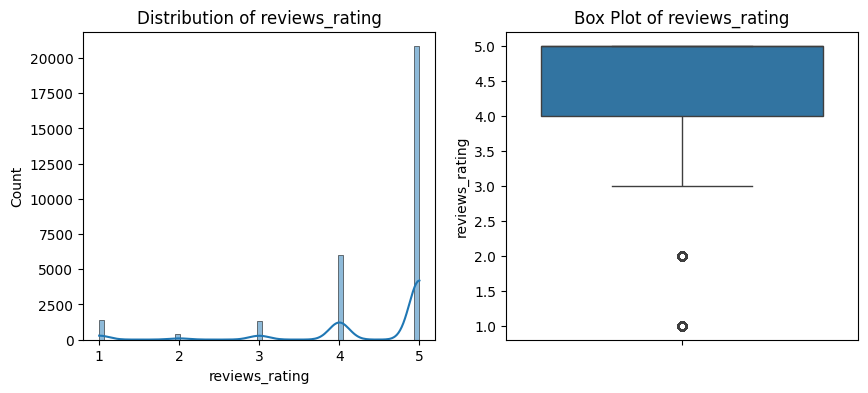

In [20]:
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.histplot(df_trans["reviews_rating"].dropna(), kde=True)
plt.title(f'Distribution of reviews_rating')
plt.subplot(1,2, 2)
sns.boxplot(y=df_trans["reviews_rating"].dropna())
plt.title(f'Box Plot of reviews_rating')

#### A significant majority of the ratings are 4 or 5!

#### Lets now analyse the categorical columns

In [21]:
cate_variables=[col for col in df_trans.columns if df_trans[col].dtype =='O']
cate_variables

['id',
 'brand',
 'categories',
 'manufacturer',
 'name',
 'reviews_date',
 'reviews_didPurchase',
 'reviews_doRecommend',
 'reviews_text',
 'reviews_title',
 'reviews_username',
 'user_sentiment']

#### Due to the high cardinality of several categorical columns, we will visualise two important categorical columns 1) reviews_didpurchase and 2) user_sentiment

In [22]:
for column in ['reviews_didPurchase','user_sentiment']:
  print(df_trans[column].value_counts())

reviews_didPurchase
False       14498
No value    14068
True         1434
Name: count, dtype: int64
user_sentiment
Positive    26632
Negative     3367
No value        1
Name: count, dtype: int64


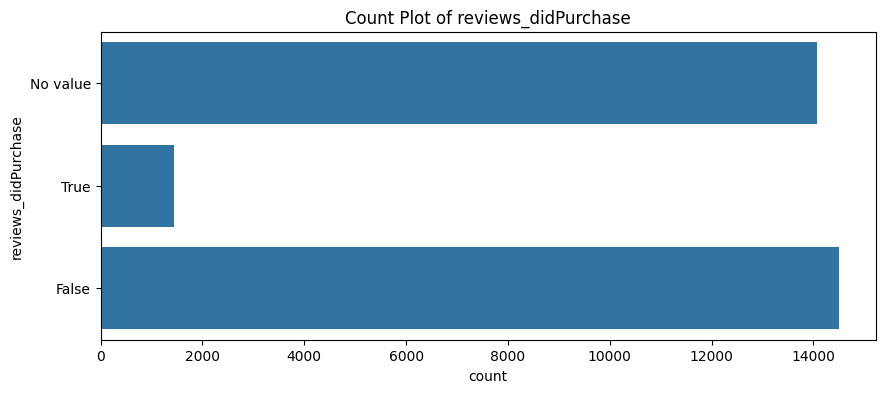

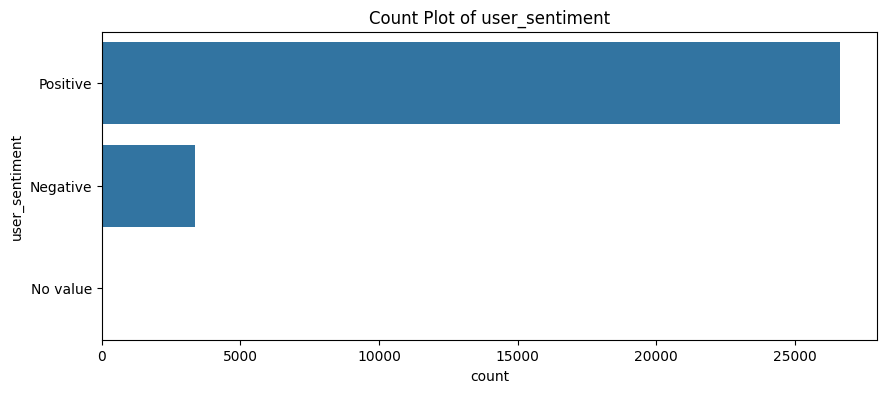

In [23]:
for column in ['reviews_didPurchase','user_sentiment']:
  plt.figure(figsize=(10, 4))
  # Count plot for categorical data
  sns.countplot(y=df_trans[column].dropna())
  plt.title(f'Count Plot of {column}')
  plt.show()

#### Check consistency between user_sentiment and user rating

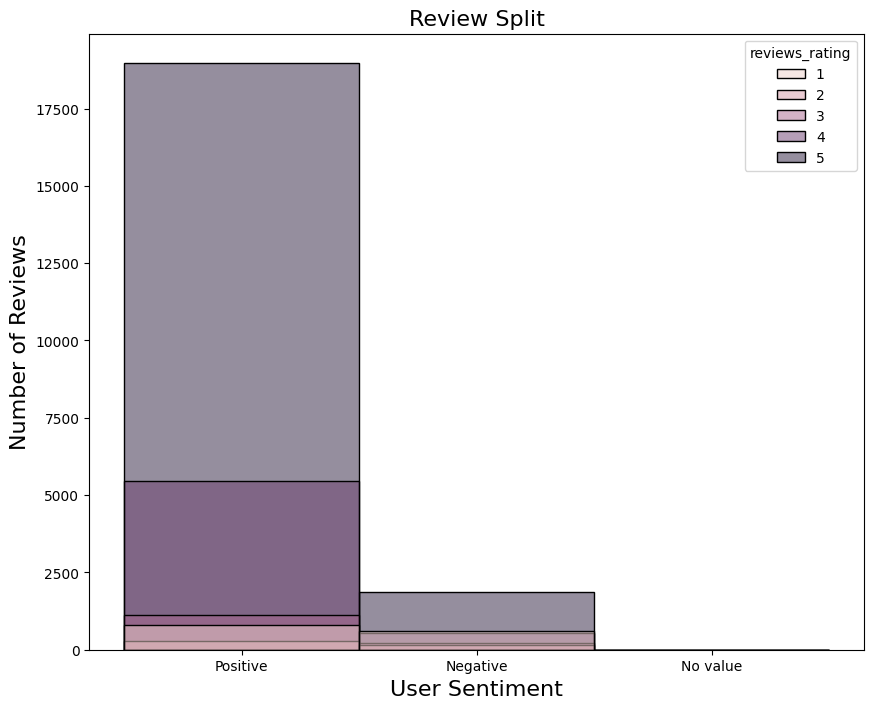

In [24]:
plt.figure(figsize=(10,8))
ax = sns.histplot(hue=df_trans['reviews_rating'],x=df_trans['user_sentiment'])
ax.set_xlabel(xlabel="User Sentiment", fontsize=16)
ax.set_ylabel(ylabel='Number of Reviews', fontsize=16)
ax.axes.set_title('Review Split', fontsize=16)
ax.tick_params(labelsize=10)

In [25]:
#df_trans.groupby('user_sentiment')['reviews_rating'].sum()

pivot_table = df_trans.pivot_table(
    index='user_sentiment',
    columns='reviews_rating',
    values='id',
    aggfunc='count',  # Aggregation function
    fill_value=0    # Replace NaN with 0
)

print("\nPivot Table:")
print(pivot_table)


Pivot Table:
reviews_rating    1    2     3     4      5
user_sentiment                             
Negative        597  140   220   550   1860
No value          0    0     0     0      1
Positive        787  280  1125  5470  18970


#### As the above pivot table indicates, the user sentiment is not consistent with the rating.

 - 1) 1067 reviews with ratings 1 or 2  are rated Positive
 - 2) 2631 reviews with ratings 3, 4 or 5 are rated Negative or No value

 We need to make these consistent. We will update the user sentiment based on the ratings provided.

In [26]:
# for correcting the user sentiment according to rating
def user_sentiment_update(x):
  if x >= 3 :
    return 'Positive'
  elif x > 0 and x < 3  :
    return 'Negative'

In [27]:
#Create a new column user_sentiment_new based on user rating
df_trans['user_sentiment_new'] = df_trans['reviews_rating'].apply(user_sentiment_update)
df_trans.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,user_sentiment_new
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Movie Bundles & Collections,CDs & Vinyl,Rap & Hip-Hop,Bass,Music on CD or Vinyl,Rap,Hip-Hop,Mainstream Rap,Pop Rap",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,No value,NaN,5,i love this album. it's very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy.,Just Awesome,joshua,Positive,Positive
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part of a promotion.,Good,dorothy w,Positive,Positive
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,dorothy w,Positive,Positive
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,"I read through the reviews on here before looking in to buying one of the couples lubricants, and was ultimately disappointed that it didn't even live up to the reviews I had read. For starters, neither my boyfriend nor I could notice any sort of enhanced or 'captivating' sensation. What we did notice, however, was the messy consistency that was reminiscent of a more liquid-y vaseline. It was difficult to clean up, and was not a pleasant, especially since it lacked the 'captivating' sensatio...",Disappointed,rebecca,Negative,Negative
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel caused irritation and it felt like it was burning my skin. I wouldn't recommend this gel.,Irritation,walker557,Negative,Negative


In [28]:
#Check consistency now

pivot_table = df_trans.pivot_table(
    index='user_sentiment_new',
    columns='reviews_rating',
    values='id',
    aggfunc='count',  # Aggregation function
    fill_value=0    # Replace NaN with 0
)

print("\nPivot Table:")
print(pivot_table)


Pivot Table:
reviews_rating         1    2     3     4      5
user_sentiment_new                              
Negative            1384  420     0     0      0
Positive               0    0  1345  6020  20831


#### Lets visualise the word frequency in the review text using Wordcloud

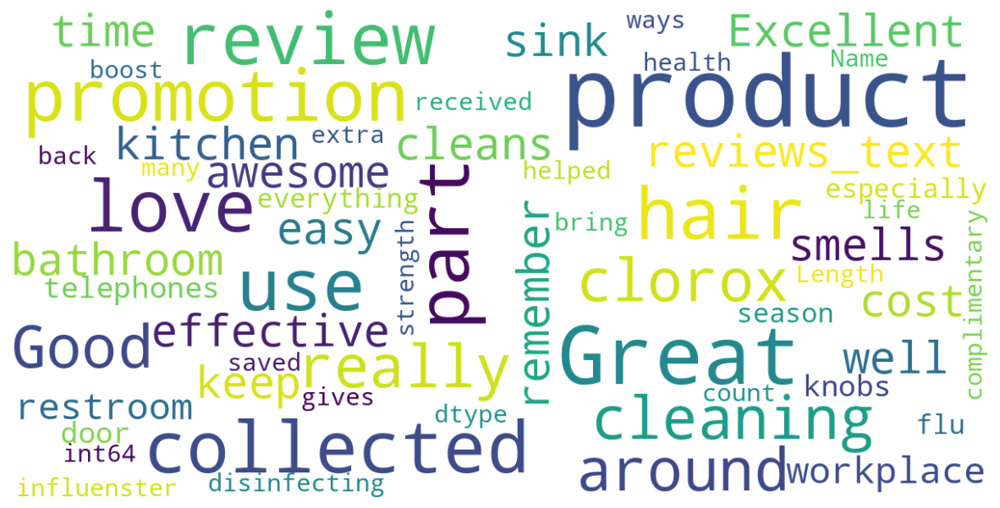

In [29]:
# To Check the most word occurence using word cloud
stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color='white', stopwords=stopwords, max_words=300, max_font_size=40,
                     scale=3, random_state=1).generate(str(df_trans['reviews_text'].value_counts()))
plt.figure(figsize=(15,15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Text Processing and preparing the data for modelling

#### Text cleanup and stop words removal

#### As part of the text clean up, we will do the following operations

* Make the text lowercase
* Remove text in square brackets
* Remove punctuation and other special characters
* Remove words containing numbers


Once we have done these cleaning operations we need to do the following;
* Remove stop words
* Lemmatize the text

In [30]:
#Function to clean up text

def rem_spec_chars(text, remove_digits=True):
    """Remove the special Characters"""
    pattern = r'[^a-zA-z0-9\s]' if not remove_digits else r'[^a-zA-z\s]'
    text = re.sub(pattern, '', text)
    return text

def clean_sent(sent):
  sent=sent.lower()  #make the text lowercase
  sent=re.sub('\[[\w\s]*\]',' ',sent) #Remove text in square brackets
  sent=re.sub('[^\w\s]',' ',sent) #Remove punctuation
  sent = rem_spec_chars (sent, True) #Remove special characters
  sent=re.sub('[\w]*[\d]+[\w]*',' ',sent) #Remove words containing numbers
  return sent



In [31]:
df_trans['reviews_text_new']=df_trans['reviews_text'].apply(lambda x:clean_sent(x))

In [32]:
df_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   30000 non-null  object
 1   brand                30000 non-null  object
 2   categories           30000 non-null  object
 3   manufacturer         29859 non-null  object
 4   name                 30000 non-null  object
 5   reviews_date         29954 non-null  object
 6   reviews_didPurchase  30000 non-null  object
 7   reviews_doRecommend  27430 non-null  object
 8   reviews_rating       30000 non-null  int64 
 9   reviews_text         30000 non-null  object
 10  reviews_title        29810 non-null  object
 11  reviews_username     29937 non-null  object
 12  user_sentiment       30000 non-null  object
 13  user_sentiment_new   30000 non-null  object
 14  reviews_text_new     30000 non-null  object
dtypes: int64(1), object(14)
memory usage: 3.4+ MB


#### Now we will remove stopwords and then lemmatize the text

In [33]:
def rem_stops(sent):
    """Remove stop words"""
    new_sent = []
    for word in sent:
        if word not in stopword_list:
            new_sent.append(word)
    return new_sent

In [34]:
def lemmat_vbs(sent):
    """Lemmatize verbs only"""
    lmt = WordNetLemmatizer()
    new_sent = []
    for word in sent:
        lemma = lmt.lemmatize(word, pos='v')
        new_sent.append(lemma)
    return new_sent

In [35]:
def stop_and_lemmat(input_text):
    tokens = nltk.word_tokenize(input_text)
    word_list = rem_stops(tokens)
    lemma_list = lemmat_vbs(word_list)
    return ' '.join(lemma_list)

In [36]:
# create a new column lemmatized_review using the  function
df_trans['lemmatized_review'] = df_trans['reviews_text_new'].apply(lambda text: stop_and_lemmat(text))

In [37]:
#review the lemmatised text alongside the original text and user sentiment to confirm data updates
df_trans[['lemmatized_review','reviews_text_new','reviews_text','user_sentiment_new','user_sentiment']].head()

,lemmatized_review,reviews_text_new,reviews_text,user_sentiment_new,user_sentiment
0,love album good hip hop side current pop sound hype listen everyday gym give star rat way metaphors crazy,i love this album it s very good more to the hip hop side than her current pop sound so hype i listen to this everyday at the gym i give it star rating all the way her metaphors are just crazy,i love this album. it's very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy.,Positive,Positive
1,good flavor review collect part promotion,good flavor this review was collected as part of a promotion,Good flavor. This review was collected as part of a promotion.,Positive,Positive
2,good flavor,good flavor,Good flavor.,Positive,Positive
3,read review look buy one couple lubricants ultimately disappoint even live review read starters neither boyfriend could notice sort enhance captivate sensation notice however messy consistency reminiscent liquid vaseline difficult clean pleasant especially since lack captivate sensation expect disappoint pay much lube use could use normal personal lubricant less money less mess,i read through the reviews on here before looking in to buying one of the couples lubricants and was ultimately disappointed that it didn t even live up to the reviews i had read for starters neither my boyfriend nor i could notice any sort of enhanced or captivating sensation what we did notice however was the messy consistency that was reminiscent of a more liquid y vaseline it was difficult to clean up and was not a pleasant especially since it lacked the captivating sensatio...,"I read through the reviews on here before looking in to buying one of the couples lubricants, and was ultimately disappointed that it didn't even live up to the reviews I had read. For starters, neither my boyfriend nor I could notice any sort of enhanced or 'captivating' sensation. What we did notice, however, was the messy consistency that was reminiscent of a more liquid-y vaseline. It was difficult to clean up, and was not a pleasant, especially since it lacked the 'captivating' sensatio...",Negative,Negative
4,husband buy gel us gel cause irritation felt like burn skin recommend gel,my husband bought this gel for us the gel caused irritation and it felt like it was burning my skin i wouldn t recommend this gel,My husband bought this gel for us. The gel caused irritation and it felt like it was burning my skin. I wouldn't recommend this gel.,Negative,Negative


### Train, Test - Build Text Classification Model

In [38]:
#Encode the negative and postive to 0 and 1 respectively
df_trans['user_sentiment_dec'] = df_trans['user_sentiment_new'].map({'Negative':0,'Positive':1})
df_trans.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,user_sentiment_new,reviews_text_new,lemmatized_review,user_sentiment_dec
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Movie Bundles & Collections,CDs & Vinyl,Rap & Hip-Hop,Bass,Music on CD or Vinyl,Rap,Hip-Hop,Mainstream Rap,Pop Rap",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,No value,NaN,5,i love this album. it's very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy.,Just Awesome,joshua,Positive,Positive,i love this album it s very good more to the hip hop side than her current pop sound so hype i listen to this everyday at the gym i give it star rating all the way her metaphors are just crazy,love album good hip hop side current pop sound hype listen everyday gym give star rat way metaphors crazy,1
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part of a promotion.,Good,dorothy w,Positive,Positive,good flavor this review was collected as part of a promotion,good flavor review collect part promotion,1
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,dorothy w,Positive,Positive,good flavor,good flavor,1
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,"I read through the reviews on here before looking in to buying one of the couples lubricants, and was ultimately disappointed that it didn't even live up to the reviews I had read. For starters, neither my boyfriend nor I could notice any sort of enhanced or 'captivating' sensation. What we did notice, however, was the messy consistency that was reminiscent of a more liquid-y vaseline. It was difficult to clean up, and was not a pleasant, especially since it lacked the 'captivating' sensatio...",Disappointed,rebecca,Negative,Negative,i read through the reviews on here before looking in to buying one of the couples lubricants and was ultimately disappointed that it didn t even live up to the reviews i had read for starters neither my boyfriend nor i could notice any sort of enhanced or captivating sensation what we did notice however was the messy consistency that was reminiscent of a more liquid y vaseline it was difficult to clean up and was not a pleasant especially since it lacked the captivating sensatio...,read review look buy one couple lubricants ultimately disappoint even live review read starters neither boyfriend could notice sort enhance captivate sensation notice however messy consistency reminiscent liquid vaseline difficult clean pleasant especially since lack captivate sensation expect disappoint pay much lube use could use normal personal lubricant less money less mess,0
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel caused irritation and it felt like it was burning my skin. I wouldn't recommend this gel.,Irritation,walker557,Negative,Negative,my husband bought this gel for us the gel caused irritation and it felt like it was burning my skin i wouldn t recommend this gel,husband buy gel us gel cause irritation felt like burn skin recommend gel,0


#### Divide the data into train and test
#### Also handling class imbalance using the "stratify" parameter in train_test_split

In [39]:
# Train and Test Divide
X_train,X_test,y_train,y_test = train_test_split(df_trans['lemmatized_review'],df_trans['user_sentiment_dec'],train_size=0.75,random_state=45,stratify=df_trans['user_sentiment_dec'])


In [40]:

y_train.value_counts()

,count
user_sentiment_dec,
1,21147
0,1353


In [41]:
y_test.value_counts()

,count
user_sentiment_dec,
1,7049
0,451


#### From the above, it is clear that the same proportion of Positive vs Negative is maintained between Train and Test data

#### Feature Extraction

####Apply the supervised models on the training data created. In this process, we have to do the following:
* Create the vector counts using Count Vectorizer
* Transform the word vector to tf-idf
* Create the train & test data using the train_test_split on the tf-idf


In [42]:
count_vectorizer = CountVectorizer()
X_count = count_vectorizer.fit_transform(X_train)


tfidf_trans = TfidfTransformer()
X_tfidf = tfidf_trans.fit_transform(X_count)
X_tfidf.shape

(22500, 12047)

In [43]:
#creating the pickle for countvectorizer and TFIDF Transformer
pickle.dump(count_vectorizer,open(pwd_path+'pickle_file/count_vector.pkl','wb'))
pickle.dump(tfidf_trans,open(pwd_path+'pickle_file/tfidf_transformer.pkl','wb'))

#### Address class imbalance using SMOTE (Imbalance learn)

In [44]:
count = Counter(y_train)
print('Before sampling :',count)

sampler = SMOTE()

X_train_smote,y_train_smote = sampler.fit_resample(X_tfidf,y_train)

count = Counter(y_train_smote)
print('After sampling :',count)

Before sampling : Counter({1: 21147, 0: 1353})
After sampling : Counter({1: 21147, 0: 21147})


#### We have to try the following models on the train and test data

- Logistic regression
- Decision Tree
- Random Forest
- Naive Bayes
- XGBoost

## Define functions to evaluate the model and grid search the hyperparameters for the model

In [45]:
# function to evaluate the model and print the results
#def model_evaluate(y_test,y_pred,y_pred_proba,type='Training'):

summary_evaluation=[]

def model_evaluate(y_test,y_pred,model_name, dict_metrics, type='Training' ): #Not used y_pred_proba
    print(type,'results')
    print('Accuracy: ', round(accuracy_score(y_test,y_pred),2))
    print('Precision: ', round(precision_score(y_test,y_pred),2))
    print('Recall: ', round(recall_score(y_test,y_pred),2))
    print('F1 Score: ', round(f1_score(y_test,y_pred),2))
    #print('ROC AUC Score: ', round(roc_auc_score(y_test,y_pred_proba),2))
    print('ROC AUC Score: ', round(roc_auc_score(y_test,y_pred),2)) #Not used y_pred_proba
    print('Classification Report: \n', classification_report(y_test,y_pred))
    cm = confusion_matrix(y_test,y_pred)
    TP = cm[1,1]  # true positive
    TN = cm[0,0]  # true negatives
    FP = cm[0,1]  # false positives
    FN = cm[1,0]  # false negatives
    sensitivity= TP / float(TP+FN)
    specificity = TN / float(TN+FP)
    print("*"*50)
    print('Confusion Matrix =')
    print(cm)
    print("sensitivity = %f" % (round(sensitivity,2)))
    print("specificity = %f" % (round(specificity,2)))
    dict_metrics.append(dict({'Model_name':model_name,
                       'Evaluation Type': type,
                       'Accuracy':round(accuracy_score(y_test,y_pred),2),
                       'Recall': round(recall_score(y_test,y_pred),2),
                       'Precision':round(precision_score(y_test,y_pred),2),
                       'F1_score':round(f1_score(y_test,y_pred),2),
                       'Roc_auc_score':round(roc_auc_score(y_test,y_pred),2),
                       'Sensitivity':round(sensitivity,2),
                       'specificity':round(specificity,2)}))
    return dict_metrics


In [46]:
# function for fitting the grid searched hyper-parameters for the model
def model_exec(model_name, model,param_grid):


    if model_name == 'XGBoost':
      model.fit(X_train_smote,y_train_smote)
      return model
    else:
      cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=40)
      grid=GridSearchCV(model,param_grid={},cv=cv,scoring='roc_auc',verbose=1,n_jobs=-1)
      grid.fit(X_train_smote,y_train_smote)
      return grid.best_estimator_


## Defining all the models and their hyperparameters for the model building exercise:

In [47]:
models={
                'LogisticRegression': LogisticRegression(),
                'Decision Tree': DecisionTreeClassifier(),
                'RandomForest': RandomForestClassifier(),
                'Multinomial Naive Bayes': MultinomialNB(),
                'XGBoost': xgb.XGBClassifier()
            }

params={
    'LogisticRegression': {
             'C': [0.001, 0.01, 0.1, 0.5, 1, 10, 100],
             'penalty': ['l1', 'l2', 'elasticnet', 'none'],
              'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
              'max_iter': [100, 200, 300, 500, 1000],
              'class_weight': [None, 'balanced']
              },
    'Decision Tree':{
            'criterion': ['gini', 'entropy'],
            'splitter': ['best', 'random'],
            'max_depth': [None, 2, 4, 6, 8, 10],
            'min_samples_split': [2, 4, 6, 8, 10],
            'min_samples_leaf': [1, 2, 4, 6, 8, 10],
            'max_features': [None, 'auto', 'sqrt', 'log2']
            } ,

    'RandomForest': {
               'n_estimators': [10, 50, 100, 200, 500],
                'criterion': ['gini', 'entropy'],
               'max_depth': [None, 2, 4, 6, 8, 10],
              'min_samples_split': [2, 4, 6, 8, 10],
              'min_samples_leaf': [1, 2, 4, 6, 8, 10],
              'max_features': [None, 'auto', 'sqrt', 'log2'],
                'bootstrap': [True, False]
              } ,

    'Multinomial Naive Bayes':
              {
              'alpha': [0.1, 0.5, 1, 2, 5],
              'fit_prior': [True, False]
              },

    'XGBoost':
             {
          'n_estimators': [100, 200, 500],
          'max_depth': [3, 5, 7],
          'learning_rate': [0.01, 0.05, 0.1],
          'gamma': [0, 0.5, 1],
          'min_child_weight': [1, 3, 5],
          'subsample': [0.5, 0.8, 1],
          'colsample_bytree': [0.5, 0.8, 1]
          }

    }

### Running and evaluating each of the models in sequence

 - We will use ROC AUC score as key criteria for evaluating the models


#### Before executing and evaluating the models, we need to transform X_test to TFIDF format

In [48]:
### We need to only transform count vectorizer and TFidftransformer, as they have already been fit using the X_train dataset
X_test_count = count_vectorizer.transform(X_test)
X_test_tfidf = tfidf_trans.transform(X_test_count)
X_test_tfidf.shape

(7500, 12047)

In [49]:
#for i in range(4,len(list(models.keys()))):
  #print(list(models.keys())[i])

In [50]:
#model=model_exec(models[list(models.keys())[4]],params[list(models.keys())[4]])

In [51]:
fitted_models = []
for i in range(len(list(models.keys()))):
  print(list(models.keys())[i],':')
  model_name = list(models.keys())[i]
  model_classifier=models[list(models.keys())[i]]
  prms=params[list(models.keys())[i]]
  model=model_exec(model_name, model_classifier,prms)
  #model_evaluate(y_train_smote,model.predict(X_train_smote),model.predict_proba(X_train_smote),type='Training')
  summary_evaluation= model_evaluate(y_train_smote,model.predict(X_train_smote),model_name, summary_evaluation, type='Training') # predict_proba is not required as we are dealing with only binary class
  #model_evaluate(y_test,model.predict(X_test_tfidf),model.predict_proba(X_test_tfidf),type='Test')
  summary_evaluation= model_evaluate(y_test,model.predict(X_test_tfidf),model_name, summary_evaluation, type='Test') # predict_proba is not required as we are dealing with only binary class
  fitted_models.append(model) # Store the best estimator for each model type into a list

LogisticRegression :
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Training results
Accuracy:  0.98
Precision:  0.98
Recall:  0.97
F1 Score:  0.98
ROC AUC Score:  0.98
Classification Report: 
               precision    recall  f1-score   support

           0       0.97      0.98      0.98     21147
           1       0.98      0.97      0.98     21147

    accuracy                           0.98     42294
   macro avg       0.98      0.98      0.98     42294
weighted avg       0.98      0.98      0.98     42294

**************************************************
Confusion Matrix =
[[20787   360]
 [  663 20484]]
sensitivity = 0.970000
specificity = 0.980000
Test results
Accuracy:  0.95
Precision:  0.99
Recall:  0.96
F1 Score:  0.97
ROC AUC Score:  0.88
Classification Report: 
               precision    recall  f1-score   support

           0       0.56      0.79      0.66       451
           1       0.99      0.96      0.97      7049

    accuracy                      

### The models are all trained. We have also completed hyper tuning of parameters during model evaluation with the test data.

### Now lets summarise the evaluation of models

In [52]:
#Check if all the
summary_evaluation

[{'Model_name': 'LogisticRegression',
  'Evaluation Type': 'Training',
  'Accuracy': 0.98,
  'Recall': 0.97,
  'Precision': 0.98,
  'F1_score': 0.98,
  'Roc_auc_score': 0.98,
  'Sensitivity': 0.97,
  'specificity': 0.98},
 {'Model_name': 'LogisticRegression',
  'Evaluation Type': 'Test',
  'Accuracy': 0.95,
  'Recall': 0.96,
  'Precision': 0.99,
  'F1_score': 0.97,
  'Roc_auc_score': 0.88,
  'Sensitivity': 0.96,
  'specificity': 0.79},
 {'Model_name': 'Decision Tree',
  'Evaluation Type': 'Training',
  'Accuracy': 1.0,
  'Recall': 1.0,
  'Precision': 1.0,
  'F1_score': 1.0,
  'Roc_auc_score': 1.0,
  'Sensitivity': 1.0,
  'specificity': 1.0},
 {'Model_name': 'Decision Tree',
  'Evaluation Type': 'Test',
  'Accuracy': 0.94,
  'Recall': 0.96,
  'Precision': 0.97,
  'F1_score': 0.97,
  'Roc_auc_score': 0.79,
  'Sensitivity': 0.96,
  'specificity': 0.61},
 {'Model_name': 'RandomForest',
  'Evaluation Type': 'Training',
  'Accuracy': 1.0,
  'Recall': 1.0,
  'Precision': 1.0,
  'F1_score': 1.

In [53]:
summary_evaluation_metrics_df = pd.DataFrame(summary_evaluation)
summary_evaluation_metrics_df

,Model_name,Evaluation Type,Accuracy,Recall,Precision,F1_score,Roc_auc_score,Sensitivity,specificity
0,LogisticRegression,Training,0.9800,0.9700,0.9800,0.9800,0.9800,0.9700,0.9800
1,LogisticRegression,Test,0.9500,0.9600,0.9900,0.9700,0.8800,0.9600,0.7900
2,Decision Tree,Training,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,Decision Tree,Test,0.9400,0.9600,0.9700,0.9700,0.7900,0.9600,0.6100
4,RandomForest,Training,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,RandomForest,Test,0.9700,0.9900,0.9700,0.9800,0.7900,0.9900,0.5900
6,Multinomial Naive Bayes,Training,0.9400,0.9200,0.9600,0.9400,0.9400,0.9200,0.9600
7,Multinomial Naive Bayes,Test,0.9100,0.9200,0.9900,0.9500,0.8700,0.9200,0.8200
8,XGBoost,Training,0.9900,0.9900,0.9800,0.9900,0.9900,0.9900,0.9800
9,XGBoost,Test,0.9600,0.9800,0.9800,0.9800,0.8200,0.9800,0.6600


## Upon execution of the four models, it is clear that Logistic Regression performs the best with a high ROC_AUC_Score and Accuracy for the test dataset

## Therefore, we will use Logistic Regression model to build the product recommendation system

In [54]:
#Review fitted models
fitted_models

[LogisticRegression(),
 DecisionTreeClassifier(),
 RandomForestClassifier(),
 MultinomialNB(),
 XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=None,
               num_parallel_tree=None, random_state=None, ...)]

#### Create pickle dump of the fitted models

In [55]:
pickle.dump(fitted_models[0],open(pwd_path+'pickle_file/final_LR_model.pkl','wb'))
pickle.dump(fitted_models[1],open(pwd_path+'pickle_file/final_DT_model.pkl','wb'))
pickle.dump(fitted_models[2],open(pwd_path+'pickle_file/final_RF_model.pkl','wb'))
pickle.dump(fitted_models[3],open(pwd_path+'pickle_file/final_NB_model.pkl','wb'))
pickle.dump(fitted_models[4],open(pwd_path+'pickle_file/final_XGB_model.pkl','wb'))

In [56]:
#final_model = pickle.load(open(pwd_path+'pickle_file/final_LR_model.pkl','rb'))
final_model = fitted_models[0]

### Recommendation System

As part of this project, we would explore the following types of recommendation systems and select the most appropriate one (with the least RMSE error)
- User based recommendation
- Item based recommendation


## User recommedation


In [57]:
#Lets review the raw source file again
source_file_df.head(5)

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Movie Bundles & Collections,CDs & Vinyl,Rap & Hip-Hop,Bass,Music on CD or Vinyl,Rap,Hip-Hop,Mainstream Rap,Pop Rap",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,NaN,NaN,5,i love this album. it's very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy.,Just Awesome,Los Angeles,NaN,joshua,Positive
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part of a promotion.,Good,NaN,NaN,dorothy w,Positive
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,NaN,NaN,dorothy w,Positive
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,"I read through the reviews on here before looking in to buying one of the couples lubricants, and was ultimately disappointed that it didn't even live up to the reviews I had read. For starters, neither my boyfriend nor I could notice any sort of enhanced or 'captivating' sensation. What we did notice, however, was the messy consistency that was reminiscent of a more liquid-y vaseline. It was difficult to clean up, and was not a pleasant, especially since it lacked the 'captivating' sensatio...",Disappointed,NaN,NaN,rebecca,Negative
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Spermicide,Health,Sexual Wellness,Lubricants",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel caused irritation and it felt like it was burning my skin. I wouldn't recommend this gel.,Irritation,NaN,NaN,walker557,Negative


In [58]:
source_file_df.shape

(30000, 15)

#### Lets see the number of unique products and unique number of users

In [59]:
#Unique products
len(source_file_df['name'].unique())

271

In [60]:
#Unique users
len(source_file_df['reviews_username'].unique())

24915

In [61]:
#Divide the data into train and test
train,test = train_test_split(source_file_df,train_size=0.70,random_state=45)
print('train shape = ',train.shape)
print('test shape = ',test.shape)

train shape =  (21000, 15)
test shape =  (9000, 15)


In [62]:
# Pivot the train dataset into matrix format in which columns are products and the rows are user names.
df_pivot_train = pd.pivot_table(index='reviews_username',
                            columns='name',
                            values='reviews_rating',data=train).fillna(0)
df_pivot_train

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz","42 Dual Drop Leaf Table with 2 Madrid Chairs""",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Disney174 Jake And The Neverland Pirates 4 Piece Bedding Set - Toddler,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Orange Scent, 84ct","Finish Quantum Dishwasher D

In [63]:
df_pivot_train.loc['joshua']

,joshua
name,
0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,0.0000
100:Complete First Season (blu-Ray),0.0000
2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,0.0000
"2x Ultra Era with Oxi Booster, 50fl oz",0.0000
"42 Dual Drop Leaf Table with 2 Madrid Chairs""",0.0000
4C Grated Parmesan Cheese 100% Natural 8oz Shaker,0.0000
5302050 15/16 FCT/HOSE ADAPTOR,0.0000
Africa's Best No-Lye Dual Conditioning Relaxer System Super,0.0000
Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,0.0000


### Creating dummy train & dummy test dataset
These datasets will be used for prediction

Dummy train will be used later for prediction of the products which have not been rated by the user. To ignore the products rated by the user, we will mark it as 0 during prediction. The products not rated by user is marked as 1 for prediction in dummy train dataset.

Dummy test will be used for evaluation. To evaluate, we will only make prediction on the products rated by the user. So, this is marked as 1. This is just opposite of dummy_train.

In [64]:
# Copy the train dataset into dummy_train
dummy_train = train.copy()

In [65]:
dummy_train.shape

(21000, 15)

In [66]:
# The products rated by user is marked as 0 and not rated by the user are marked '1' for prediction.
dummy_train['reviews_rating'] = dummy_train['reviews_rating'].apply(lambda x: 0 if x>=1 else 1)

In [67]:
# Convert the dummy train dataset into matrix format.
dummy_train_pivot = pd.pivot_table(
    index='reviews_username',
    columns='name',
    values='reviews_rating', data=dummy_train
).fillna(1)

In [68]:
dummy_train_pivot.shape

(18205, 254)

**Cosine Similarity**

Cosine Similarity is a measurement that quantifies the similarity between two vectors  

**Adjusted Cosine**

Adjusted cosine similarity is a modified version of vector-based similarity where we incorporate the fact that different users have different ratings schemes. In other words, some users might rate items highly in general, and others might give items lower ratings as a preference. To handle this nature from rating given by user , we subtract average ratings for each user from each user's rating for different products.

In [69]:
# Creating a version of the train data pivot with NaN values
df_pivot_train_adjcos = pd.pivot_table(index='reviews_username',
                            columns='name',
                            values='reviews_rating',data=train)

In [70]:
df_pivot_train_adjcos.loc['joshua']

,joshua
name,
0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,NaN
100:Complete First Season (blu-Ray),NaN
2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,NaN
"2x Ultra Era with Oxi Booster, 50fl oz",NaN
"42 Dual Drop Leaf Table with 2 Madrid Chairs""",NaN
4C Grated Parmesan Cheese 100% Natural 8oz Shaker,NaN
5302050 15/16 FCT/HOSE ADAPTOR,NaN
Africa's Best No-Lye Dual Conditioning Relaxer System Super,NaN
Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,NaN


In [71]:
# this is a function to return the user correlation matrix based on adjusted cosine similarity and subtracted df
import numpy as np

def adj_cosine_similarity(df):
    # using the adjusted cosine similarity
    mean_df = np.nanmean(df,axis=1)
    subt_df = (df.T - mean_df).T # Normalized dataset
    # using the pairwise_distance for cosine similarity
    user_correlation = 1- pairwise_distances (subt_df.fillna(0),metric='cosine')
    user_correlation[np.isnan(user_correlation)] = 0
    return user_correlation,subt_df


In [72]:
#Calculating the user correlation and normalised df
user_correlation_matrix,norm_df = adj_cosine_similarity(df_pivot_train_adjcos)
user_correlation_matrix

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [73]:
user_correlation_matrix.shape

(18205, 18205)

#### Predictions -

Doing the prediction for the users which are positively related with other users, and not the users which are negatively related as we are interested in the users which are more similar to the current users. So, ignoring the correlation for values less than 0.

In [74]:
user_correlation_matrix[user_correlation_matrix < 0] = 0
user_correlation_matrix.shape

(18205, 18205)

In [75]:
user_reco_predicted_ratings = np.dot(user_correlation_matrix,df_pivot_train_adjcos.fillna(0))
user_reco_predicted_ratings

array([[0.        , 0.        , 0.        , ..., 2.74344551, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [76]:
user_reco_predicted_ratings.shape

(18205, 254)

In [77]:
user_reco_predicted_ratings_fin = np.multiply(user_reco_predicted_ratings,dummy_train_pivot)
user_reco_predicted_ratings_fin

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz","42 Dual Drop Leaf Table with 2 Madrid Chairs""",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Disney174 Jake And The Neverland Pirates 4 Piece Bedding Set - Toddler,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Orange Scent, 84ct","Finish Quantum Dishwasher D

In [78]:
# Creating a pickle file for user-user recommendation system
#import pickle
pickle.dump(user_reco_predicted_ratings_fin,open(pwd_path+'pickle_file/final_user_reco_rating.pkl','wb'))

### Finding the top 20 recommendation for a given *user*

In [79]:
# Take the user ID as input.
user_input = input("Enter your user name")
print(user_input)

Enter your user namejoshua
joshua


In [80]:
user_reco_predicted_ratings_fin
user_reco_predicted_ratings_fin.loc[user_input].sort_values(ascending=False)[0:20]

,joshua
name,
My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital),9.4460
Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,9.2915
Mike Dave Need Wedding Dates (dvd + Digital),7.5487
Planes: Fire Rescue (2 Discs) (includes Digital Copy) (blu-Ray/dvd),5.7408
The Resident Evil Collection 5 Discs (blu-Ray),4.8274
Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,3.1321
"Pendaflex174 Divide It Up File Folder, Multi Section, Letter, Assorted, 12/pack",3.0710
Jason Aldean - They Don't Know,2.6837
Meguiar's Ultimate Quik Detailer 22-Oz.,2.2592


### Evaluation for user-user recommendation system

In [81]:
## # Find out the common users of test and train dataset.
common = test[test.reviews_username.isin(train.reviews_username)]
common.shape

(2006, 15)

In [82]:
user_correlation_df = pd.DataFrame(user_correlation_matrix)

In [83]:
user_correlation_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,17955,17956,17957,17958,17959,17960,17961,17962,17963,17964,17965,17966,17967,17968,17969,17970,17971,17972,17973,17974,17975,17976,17977,17978,17979,17980,17981,17982,17983,17984,17985,17986,17987,17988,17989,17990,17991,17992,17993,17994,17995,17996,17997,17998,17999,18000,18001,18002,18003,18004,18005,18006,18007,18008,18009,18010,18011,18012,18013,18014,18015,18016,18017,18018,18019,18020,18021,18022,18023,18024,18025,18026,18027,18028,18029,18030,18031,18032,18033,18034,18035,18036,18037,18038,18039,18040,18041,18042,18043,18044,18045,18046,18047,18048,18049,18050,18051,18052,18053,18054,18055,18056,18057,18058,18059,18060,18061,18062,18063,18064,18065,18066,18067,18068,18069,18070,18071,18072,18073,18074,18075,18076,18077,18078,18079,18080,18081,18082,18083,18084,18085,18086,18087,18088,18089,18090,18091,18092,18093,18094,18095,18096,18097,18098,18099,18100,18101,18102,18103,18104,18105,18106,18107,18108,18109,18110,18111,18112,18113,18114,18115,18116,18117,18118,18119,18120,18121,18122,18123,18124,18125,18126,18127,18128,18129,18130,18131,18132,18133,18134,18135,18136,18137,18138,18139,18140,18141,18142,18143,18144,18145,18146,18147,18148,18149,18150,18151,18152,18153,18154,18155,18156,18157,18158,18159,18160,18161,18162,18163,18164,18165,18166,18167,18168,18169,18170,18171,18172,18173,18174,18175,18176,18177,18178,18179,18180,18181,18182,18183,18184,18185,18186,18187,18188,18189,18190,18191,18192,18193,18194,18195,18196,18197,18198,18199,18200,18201,18202,18203,18204
0,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,

In [84]:
user_correlation_df['user_name'] = norm_df.index
user_correlation_df.set_index('user_name',inplace=True)
user_correlation_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,17955,17956,17957,17958,17959,17960,17961,17962,17963,17964,17965,17966,17967,17968,17969,17970,17971,17972,17973,17974,17975,17976,17977,17978,17979,17980,17981,17982,17983,17984,17985,17986,17987,17988,17989,17990,17991,17992,17993,17994,17995,17996,17997,17998,17999,18000,18001,18002,18003,18004,18005,18006,18007,18008,18009,18010,18011,18012,18013,18014,18015,18016,18017,18018,18019,18020,18021,18022,18023,18024,18025,18026,18027,18028,18029,18030,18031,18032,18033,18034,18035,18036,18037,18038,18039,18040,18041,18042,18043,18044,18045,18046,18047,18048,18049,18050,18051,18052,18053,18054,18055,18056,18057,18058,18059,18060,18061,18062,18063,18064,18065,18066,18067,18068,18069,18070,18071,18072,18073,18074,18075,18076,18077,18078,18079,18080,18081,18082,18083,18084,18085,18086,18087,18088,18089,18090,18091,18092,18093,18094,18095,18096,18097,18098,18099,18100,18101,18102,18103,18104,18105,18106,18107,18108,18109,18110,18111,18112,18113,18114,18115,18116,18117,18118,18119,18120,18121,18122,18123,18124,18125,18126,18127,18128,18129,18130,18131,18132,18133,18134,18135,18136,18137,18138,18139,18140,18141,18142,18143,18144,18145,18146,18147,18148,18149,18150,18151,18152,18153,18154,18155,18156,18157,18158,18159,18160,18161,18162,18163,18164,18165,18166,18167,18168,18169,18170,18171,18172,18173,18174,18175,18176,18177,18178,18179,18180,18181,18182,18183,18184,18185,18186,18187,18188,18189,18190,18191,18192,18193,18194,18195,18196,18197,18198,18199,18200,18201,18202,18203,18204
user_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00sab00,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0

In [85]:
list_name = common.reviews_username.tolist()

In [86]:
user_correlation_df.columns = norm_df.index.tolist()
user_correlation_df.columns

Index(['00sab00', '02dakota', '02deuce', '0325home', '06stidriver', '1.11E+24', '1085', '10ten', '11111111aaaaaaaaaaaaaaaaa', '11677j',
       ...
       'zowie', 'zozo0o', 'zsazsa', 'zt313', 'zubb', 'zuttle', 'zwithanx', 'zxcsdfd', 'zyiah4', 'zzdiane'], dtype='object', length=18205)

In [87]:
user_correlation_df_1 = user_correlation_df[user_correlation_df.index.isin(list_name)]
user_correlation_df_1.shape

(1687, 18205)

In [88]:
user_correlation_df_2 = user_correlation_df_1.T[user_correlation_df_1.T.index.isin(list_name)]
user_correlation_df_3 = user_correlation_df_2.T
user_correlation_df_3.head()

,1234,123charlie,143st,1943,4cloroxl,50cal,7inthenest,aac06002,aaron,abby,abcdef,abcdefghij,abismomy,ac94,acellacey,acg1,acjuarez08,acv4217,adam,adma2,adriana9999,ael26,aep1010,afwifey2003,agmt,ah78,aimee,aisha,aj,aj2012,ajackson75,ajface24,aktcharlotte,alena125,alex,alexa86,alexis,ali1353,alice,alisonr,allan6048,ally,alm27,alredhouse,alvin,aly16,amanda,amanda01,amanda13,amandamueller,amandarose,amazing,amber,ambr1207,ami35,amishmom,amlyke,ammcam,amor,amy1,amy75,amyw333,amyx3duh,anabanana2112,andi,andrea,andrew,andy,ang32,angel,angelbabee1965,angie,angie0104,angie2,animallover,anita,anna,anna1202,anne,annie,annieb,annoymous,anon,anonymous 1,anyab,april,aria,arlene,arlingtondonna,arno,arob,artfulhousewife,as123,ash23,ash82085,ashley,ashley06,ashleyden,ashz131,askk808,athenabear,atid,auntie,auntsan,auroradawn,autumn,ayterrazas,azu12,babas,babybear324,babygirl,bailee,bakie,bambi,banana,barb24,barbarajean,bargainhuntergmaoftwo,bargeboy3,barra2,bas56,batman,batmanny,batts,bb,bblack,bbshopper,bcg10713,bean,bearyshopper2,beaterman,beautymaven,beccaruth,becky227,becky75,bernie,bert,bessie,bestbuyer,beth,beth46,beth74,bethm,bethp,betsy,betty,bhemp,bhere4u,bigb,bigdaddy,bigdaddybuttah,bigred1,bill,billierose,billybob789,bjh1,bjhoneybear,blaze,blondie,bloomingingrace,blt66,blue91,bluebox,bluefox,bluu,bnspirit,bobby,bochie,bonbon,bonniebrooks,boobie1973,boomer,bostongirl,bostonmommy,brady,brandon,brandy,branfachris,branjo12,brecca,brendac,brian,brijuelz,britt,brittany,brittneezy,brittyer,browndiva007,brownshuga40,bru1,bruce,bryan,bsgw,bsolheim9,bubba,bubbs33,bucket,buckeye,bumblebee0513,bunny,buster,busymom,busymom12,buttercup,bwbstr435,bwoh,byamazon customer,bybarbara edwards,byfinzin,byjennifer,bykindle customer,bylaura c,bymugwhamp,candy,cangel83,cannon,canyons422,carlos,carls,carol,carol1102,caroline,carolnog22,carolynrk,carrie,carrot1991,carsonensley,casper87,cassandra,cassieh,castle,catfan,cath,cathy,catjs,catl,cber,ccccc,cdavadi,cdedbdb,cece1,cecy89,celeste,cfogle,cgranados,champ,chandraw,charles,charlie,charvey,...,shell,shell84,shelle,shellsbells,shelly,sher,sher017,sherio918,sherry,shopper,shoty71,simplysarah,sjdeste,sjohnny,skeeter,skippyj,skladj,skwr,skylarrkenzie,skyy,sle2505,sleestak50,slim,slufdriver,sm01,smiley82,smith2127,smkaddy,snaktime,snapit27,somergirl,sorensen777,sornum4,sous,southernnights,spanky,sparky,spedteacher,spidey,spidysgirl,spunky,squat,squirrel,sr12,sriracha,sscc,ssibeachbum,sslank,stacey15,staci,staclove,stacy,stacyf416,starflower,stayhomemother,stef31,stellasmama,steph,steph65,stephanie,stephanie1219,stephanie8810,stephcakes,steve,stevie,still unhappy,stra,striker,stynkie,sue,suebell,summer2474,sunny2,sunshine,sunshinebabe,sup3rmom,supergirl,supertaz93,susan1,susie,suzanne4391,suzybear,suzyq,swanky1,sweetpea8050,sweetwater1856,synoptic 12,tabbicake,takisha56ett,talmariejohn,tami,tami62,tammy,tamzcat,tania13,tara,tara6384,tara85,tarao,taratully,tarheelfan,tati2015,taurusanaya,tayaktar,tdenmon,tdyork23,teacher,technobabe415,teckys4,tedd,tee1969,teecherbabe,teerudy,teetee,tenaj842,teresa,terr,terry,tess,tess22,tetter74,texasmomma7899,tgregory,thai,thatoneguy,the office guro,the1stbambito,thebeast13,thenaptimereviewer,thenikkistandard,thequeen,theresa79,theresabp,theresah,thewix,thomas,thomcat11,thumperthebunny,tiaalese,tierrah,tiff4199,tiffy,tigmommy,timmy,tina,tina40,tina71,tisha9878,tjab,tman,tmc1,tobaira,toby,toddster7,tominator,tony,tony1,tonybdub,tooney38,toots,tootsie23,toridear,toshcal,tracelyn28,tracie,trav,trcvngrn,treese,trichmond,trina,trix,trpfeffer3,truckinbarbie,truth,tstarr,ttdebbi,ttia,tucker65,turi,turtle,turtleboy,turtlesgirl7,tw350z,twebb,tweetyanne,twiggy575,tycr,tyler,tyreese,ulcunique,unicorn351,unnamed,uu1622,val,val214,valeriecherry,vc13,venus24,vette,vick88,vicki,vickie,vickie456,victor,victoria29,viewer,vikki,viper,vivian,vivienne,vkay,vreal88,vyph,vypkf0,watson28,wendy2245,wendy59,wernigcourtney,whythis,wil27,wildman,willy,wimbly,winniepoo2,wise,wiseman378,wizard,wjb1,wolf,wonste

In [89]:
common_user_based_matrix = pd.pivot_table(index='reviews_username',
                            columns='name',
                            values='reviews_rating',data=common)

In [90]:
common_user_based_matrix

name,100:Complete First Season (blu-Ray),Alex Cross (dvdvideo),"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz","Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Beanitos Bean Chips, Simply Pinto Bean","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets","Burt's Bees Lip Shimmer, Raisin","Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,CeraVe SA Renewing Cream,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Coty Airspun Face Powder, Translucent Extra Coverage","Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Eagle Fat Free Sweetened Condensed Milk,Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Quantum Dishwasher Detergent, Lemon Sparkle Scent, 45 Count",Fiskars174 Classic Stick Rotary Cutter (45 Mm),Gain Original Scent Liquid Fabric Softener 129 Oz,Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,Hawaiian Punch Berry Limeade Blast Juice,Hollywood Beauty Olive Cholesterol,Hoover174 Platinum Collection153 Lightweight Bagged Upright Vacuum With Canister - Uh30010com,"Hormel Chili, No Beans",Jason Aldean - They Don't Know,Jolly Time Select Premium Yellow Pop Corn,"Just For Men Touch Of Gray Gray Hair Treatment, Black T-55",K-Y Love Sensuality Pleasure Gel,Kendall Comforter And Sheet Set (twin) Aqua - 7pc,Kind Dark Chocolate Chunk Gluten Free Granola Bars - 5 Count,Kind Nut Delight Bar,L'or233al Paris Elvive Extraordinary Clay Rebalancing Conditioner - 12.6 Fl Oz,L'oreal Paris Advanced Hairstyle Boost It High Lift Creation Spray,L'oreal Paris Advanced Hairstyle TXT IT Hyper-Fix Putty,"L'oreal Paris Colour Caresse Wet Shine Stain, Pink Resistance",Leslie Sansone:Belly Blasting Walk (dvd),Lundberg Organic Cinnamon Toast Rice Cakes,"Lundberg Wehani Rice, 25lb",Lynk Professional174 Pull Out Cutting Board Bakeware Sliding Cabinet Organizer,"Lysol Concentrate Deodorizing Cleaner, Original Scent",Maranatha No Stir Raw Maple Almond Butter,Meguiar's Deep Crystal Car Wash 64-Oz.,Mike Dave Need Wedding Dates (dvd + Digital),Mill Creek Aloe Vera & Paba Lotion,Mrs. Meyer's Lemon Verbena Surface Scrub,Mrs. Meyer's174 Lemon Verbena Laundry Scent Booster - 18oz,My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital),Nature's Path Chunky Chocolate Peanut Chewy Granola Bars,Nature's Path Flax Plus Maple Pecan Crunch Cereal,Naturtint Nutrideep Multiplier Protective Cream,Nearly Natural 5.5' Bamboo W/decorative Planter,Nexxus Exxtra Gel Style Creation Sculptor,"Ogx Conditioner, Hydrating Teatree Mint",Olay Regenerist Deep Hydration Regenerating Cream,"Pantene Color Preserve Volume Shampoo, 25.4oz",Pantene Pro-V Expert Collection Age Defy Conditioner,"Pendaf

In [91]:
user_correlation_df_3[user_correlation_df_3<0] = 0
common_user_pred_rating =  np.dot(user_correlation_df_3,common_user_based_matrix.fillna(0))
common_user_pred_rating

array([[1.66666667, 1.15470054, 0.        , ..., 0.        , 1.33333333,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [2.88675135, 2.        , 0.        , ..., 1.41578736, 2.30940108,
        0.        ]])

In [92]:
#Creating the dummy test - Only run evaluation where the user has already rated
dummy_test = common.copy()
dummy_test['reviews_rating'] =dummy_test['reviews_rating'].apply(lambda x: 1 if x>=1 else 0)
dummy_test = pd.pivot_table(index='reviews_username',
                            columns='name',
                            values='reviews_rating',data=dummy_test).fillna(0)
dummy_test

name,100:Complete First Season (blu-Ray),Alex Cross (dvdvideo),"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz","Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Beanitos Bean Chips, Simply Pinto Bean","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets","Burt's Bees Lip Shimmer, Raisin","Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,CeraVe SA Renewing Cream,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Coty Airspun Face Powder, Translucent Extra Coverage","Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Eagle Fat Free Sweetened Condensed Milk,Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Quantum Dishwasher Detergent, Lemon Sparkle Scent, 45 Count",Fiskars174 Classic Stick Rotary Cutter (45 Mm),Gain Original Scent Liquid Fabric Softener 129 Oz,Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,Hawaiian Punch Berry Limeade Blast Juice,Hollywood Beauty Olive Cholesterol,Hoover174 Platinum Collection153 Lightweight Bagged Upright Vacuum With Canister - Uh30010com,"Hormel Chili, No Beans",Jason Aldean - They Don't Know,Jolly Time Select Premium Yellow Pop Corn,"Just For Men Touch Of Gray Gray Hair Treatment, Black T-55",K-Y Love Sensuality Pleasure Gel,Kendall Comforter And Sheet Set (twin) Aqua - 7pc,Kind Dark Chocolate Chunk Gluten Free Granola Bars - 5 Count,Kind Nut Delight Bar,L'or233al Paris Elvive Extraordinary Clay Rebalancing Conditioner - 12.6 Fl Oz,L'oreal Paris Advanced Hairstyle Boost It High Lift Creation Spray,L'oreal Paris Advanced Hairstyle TXT IT Hyper-Fix Putty,"L'oreal Paris Colour Caresse Wet Shine Stain, Pink Resistance",Leslie Sansone:Belly Blasting Walk (dvd),Lundberg Organic Cinnamon Toast Rice Cakes,"Lundberg Wehani Rice, 25lb",Lynk Professional174 Pull Out Cutting Board Bakeware Sliding Cabinet Organizer,"Lysol Concentrate Deodorizing Cleaner, Original Scent",Maranatha No Stir Raw Maple Almond Butter,Meguiar's Deep Crystal Car Wash 64-Oz.,Mike Dave Need Wedding Dates (dvd + Digital),Mill Creek Aloe Vera & Paba Lotion,Mrs. Meyer's Lemon Verbena Surface Scrub,Mrs. Meyer's174 Lemon Verbena Laundry Scent Booster - 18oz,My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital),Nature's Path Chunky Chocolate Peanut Chewy Granola Bars,Nature's Path Flax Plus Maple Pecan Crunch Cereal,Naturtint Nutrideep Multiplier Protective Cream,Nearly Natural 5.5' Bamboo W/decorative Planter,Nexxus Exxtra Gel Style Creation Sculptor,"Ogx Conditioner, Hydrating Teatree Mint",Olay Regenerist Deep Hydration Regenerating Cream,"Pantene Color Preserve Volume Shampoo, 25.4oz",Pantene Pro-V Expert Collection Age Defy Conditioner,"Pendaf

In [93]:
common_user_pred_ratings_fin =  np.multiply(common_user_pred_rating,dummy_test)
common_user_pred_ratings_fin

name,100:Complete First Season (blu-Ray),Alex Cross (dvdvideo),"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz","Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Beanitos Bean Chips, Simply Pinto Bean","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets","Burt's Bees Lip Shimmer, Raisin","Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,CeraVe SA Renewing Cream,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Coty Airspun Face Powder, Translucent Extra Coverage","Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Eagle Fat Free Sweetened Condensed Milk,Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Quantum Dishwasher Detergent, Lemon Sparkle Scent, 45 Count",Fiskars174 Classic Stick Rotary Cutter (45 Mm),Gain Original Scent Liquid Fabric Softener 129 Oz,Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,Hawaiian Punch Berry Limeade Blast Juice,Hollywood Beauty Olive Cholesterol,Hoover174 Platinum Collection153 Lightweight Bagged Upright Vacuum With Canister - Uh30010com,"Hormel Chili, No Beans",Jason Aldean - They Don't Know,Jolly Time Select Premium Yellow Pop Corn,"Just For Men Touch Of Gray Gray Hair Treatment, Black T-55",K-Y Love Sensuality Pleasure Gel,Kendall Comforter And Sheet Set (twin) Aqua - 7pc,Kind Dark Chocolate Chunk Gluten Free Granola Bars - 5 Count,Kind Nut Delight Bar,L'or233al Paris Elvive Extraordinary Clay Rebalancing Conditioner - 12.6 Fl Oz,L'oreal Paris Advanced Hairstyle Boost It High Lift Creation Spray,L'oreal Paris Advanced Hairstyle TXT IT Hyper-Fix Putty,"L'oreal Paris Colour Caresse Wet Shine Stain, Pink Resistance",Leslie Sansone:Belly Blasting Walk (dvd),Lundberg Organic Cinnamon Toast Rice Cakes,"Lundberg Wehani Rice, 25lb",Lynk Professional174 Pull Out Cutting Board Bakeware Sliding Cabinet Organizer,"Lysol Concentrate Deodorizing Cleaner, Original Scent",Maranatha No Stir Raw Maple Almond Butter,Meguiar's Deep Crystal Car Wash 64-Oz.,Mike Dave Need Wedding Dates (dvd + Digital),Mill Creek Aloe Vera & Paba Lotion,Mrs. Meyer's Lemon Verbena Surface Scrub,Mrs. Meyer's174 Lemon Verbena Laundry Scent Booster - 18oz,My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital),Nature's Path Chunky Chocolate Peanut Chewy Granola Bars,Nature's Path Flax Plus Maple Pecan Crunch Cereal,Naturtint Nutrideep Multiplier Protective Cream,Nearly Natural 5.5' Bamboo W/decorative Planter,Nexxus Exxtra Gel Style Creation Sculptor,"Ogx Conditioner, Hydrating Teatree Mint",Olay Regenerist Deep Hydration Regenerating Cream,"Pantene Color Preserve Volume Shampoo, 25.4oz",Pantene Pro-V Expert Collection Age Defy Conditioner,"Pendaf

In [94]:
from sklearn.preprocessing import MinMaxScaler
from numpy import *

X  = common_user_pred_ratings_fin.copy()
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)
y.shape

MinMaxScaler(feature_range=(1, 5))
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


(1687, 120)

In [95]:
# Finding total non-NaN value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [96]:
total_non_nan

303

In [97]:
common_pivot = pd.pivot_table(index='reviews_username',
                            columns='name',
                            values='reviews_rating',data=common)
common_pivot.head()

name,100:Complete First Season (blu-Ray),Alex Cross (dvdvideo),"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz","Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Beanitos Bean Chips, Simply Pinto Bean","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets","Burt's Bees Lip Shimmer, Raisin","Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,CeraVe SA Renewing Cream,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Coty Airspun Face Powder, Translucent Extra Coverage","Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Eagle Fat Free Sweetened Condensed Milk,Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Quantum Dishwasher Detergent, Lemon Sparkle Scent, 45 Count",Fiskars174 Classic Stick Rotary Cutter (45 Mm),Gain Original Scent Liquid Fabric Softener 129 Oz,Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,Hawaiian Punch Berry Limeade Blast Juice,Hollywood Beauty Olive Cholesterol,Hoover174 Platinum Collection153 Lightweight Bagged Upright Vacuum With Canister - Uh30010com,"Hormel Chili, No Beans",Jason Aldean - They Don't Know,Jolly Time Select Premium Yellow Pop Corn,"Just For Men Touch Of Gray Gray Hair Treatment, Black T-55",K-Y Love Sensuality Pleasure Gel,Kendall Comforter And Sheet Set (twin) Aqua - 7pc,Kind Dark Chocolate Chunk Gluten Free Granola Bars - 5 Count,Kind Nut Delight Bar,L'or233al Paris Elvive Extraordinary Clay Rebalancing Conditioner - 12.6 Fl Oz,L'oreal Paris Advanced Hairstyle Boost It High Lift Creation Spray,L'oreal Paris Advanced Hairstyle TXT IT Hyper-Fix Putty,"L'oreal Paris Colour Caresse Wet Shine Stain, Pink Resistance",Leslie Sansone:Belly Blasting Walk (dvd),Lundberg Organic Cinnamon Toast Rice Cakes,"Lundberg Wehani Rice, 25lb",Lynk Professional174 Pull Out Cutting Board Bakeware Sliding Cabinet Organizer,"Lysol Concentrate Deodorizing Cleaner, Original Scent",Maranatha No Stir Raw Maple Almond Butter,Meguiar's Deep Crystal Car Wash 64-Oz.,Mike Dave Need Wedding Dates (dvd + Digital),Mill Creek Aloe Vera & Paba Lotion,Mrs. Meyer's Lemon Verbena Surface Scrub,Mrs. Meyer's174 Lemon Verbena Laundry Scent Booster - 18oz,My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital),Nature's Path Chunky Chocolate Peanut Chewy Granola Bars,Nature's Path Flax Plus Maple Pecan Crunch Cereal,Naturtint Nutrideep Multiplier Protective Cream,Nearly Natural 5.5' Bamboo W/decorative Planter,Nexxus Exxtra Gel Style Creation Sculptor,"Ogx Conditioner, Hydrating Teatree Mint",Olay Regenerist Deep Hydration Regenerating Cream,"Pantene Color Preserve Volume Shampoo, 25.4oz",Pantene Pro-V Expert Collection Age Defy Conditioner,"Pendaf

#### Calculating RMSE for user based rating

In [98]:
rmse = (sum(sum((common_pivot -  y )**2))/total_non_nan)**0.5
print(rmse)

2.379138318001231


### Item recommendation system

In [99]:
df_pivot_train_adjcos_item = df_pivot_train_adjcos.T
df_pivot_train_adjcos_item.head()

reviews_username,00sab00,02dakota,02deuce,0325home,06stidriver,1.11E+24,1085,10ten,11111111aaaaaaaaaaaaaaaaa,11677j,1234,1234561,1234567,1234asdf,123cat123,123charlie,123rs,123soccermom,123too,127726,12gage,13thfaerie,1421nikki,143st,148maine,1515,15425shopper,170361eggs,1753,17roses,18612,1943,1950rmm,1968bear,1970,1979edes,19bubba67,1boomer,1buzymom,1cadet,1chynna,1clean1,1cleaner,1derpet1,1disappoint,1gamer,1glenn,1gra,1gussy,1happymom,1healthytot,1hotmama,1jc1,1kindword,1nikki31t,1officegal,1okc2thunder3up4,1olaygal,1scooby1,1shop,1sonny,1stcavdivision,1stgrade,1stlady,1sttimemama,1sungirl,1tomg,1wildbill2l,1witch,2011pink2011,2013bestbuyer,2014bestbuys,2015mom,2016,2016home,2016parker10,2062351337,20crafter16,210tundra,2175046722,232323,23jen,2455,24hrstoneroses,2532674594,25happyshopper,28green,295259,2athome,2bgreen,2big,2busy4u,2clean4me,2dobies,2ds4es14,2forhokies,2go4savings,2hearts1love,2low4zero,2sweetdaisies,2thumbsup,2w0cat5z,2xmom,30103,3375509742,370gt,37f5p,3babiesat41,3bear,3bees,3boys2turtles5chicks,3card,3dknights,3dmoviewatcher,3lilones,3littlegirls,3littleswimmers,3ringbandb,3ringcircus,3sawhorsesneeded,3scissors,3skyyblue,4 rooms 1 dog lotsa fur,4048197640,405april,44pam44,45177ss,49erfaithful,4bukfam,4cloroxl,4djs,4dogmom,4frugal,4littleones,4luds,4my5goldens,4parman,4shop,4stew57,4th grade teacher,4theloveofclorox,4wipes,500mpl,50cal,5150seriousshopper5150,530germkiller,54867906,57susie,5alarm,5boysohmy,5kids,5mcdaniels,5star414,5zenuff,6211958,63lamb,64falcon,66babe,66cutie,67firebird,69chopper,6cockers,7,7.87E+11,70chp,70cohoosier,714reginald,714rv,7737593842,7frances7,7inthenest,7of9,7rick,8.84E+11,80021mom,80204,8023,808wrx,81t21,85721747267,85lisa,8675309,88brit06,89c46698305f04e39d57a88a2c5c3ce297787288,8ellie24,8mooshu,8sk8anddon8,8thred,9003058363,911notimetoshop,9373weld,98nd500,99runner,_christenak,a hutch,a1cbee1481,a1s3,a77077,a786,a7xmaddlove,aaaa,aabrannon,aac06002,aac3,aagbaghagmom,aakon,aalyah,aarhus74,aaron,aaronabigail,aaronm,aaube1990,aaulvu,ab1015,ab86,ababe,abacadaba,abananie,abarker1215,abashli,abaybay,abbey,abbey64,abbi,abbs77,abbuyguy,abby,abby1,abby11,abby132,abby8992,abbysmama,abc,abc4sb206,abcd,abcdef,abcdefghij,abcssds,abctech,abd1,abear93,abefroman,abesb,abeverly7,abf1987,abg0821,abi09,abigail,abigail32,abihaven,...,woofwoofwoof,wooha,woohoo,woottos,woowoo,wordyone,workathome,workfromhomemom,working1,workinggirl,workingit,workingmom,workingmom28,workingmomof1,worm,wowiezowie,wownostreaks,wowwie,wrat,wrdgrl,wren113,wrenny,wright11,wrigleysmom,write2kjf,writerstone,wspeedracerz28,wsweetie,wtchawmn,wut54,wuv2sh0p,wvmommy,wvpcollins,wvshopaholic,wwphf,wyatt,wyatt09,wylynn,wynn,wynnepoohplayer,wyomingkat,wyoshopgril,xaiver,xanadu72,xander,xavenger,xavier,xaviersmommy110311,xbflysky,xbox,xboxdad,xcanuck,xcelerate,xcoach98,xcoupon,xcrisstanicolex,xena,xenawp,xeon500cc,xfilipinox,xgivanx,xhillbill,xhulia,xiihong,xl,xman,xmas,xmhana,xmom,xnerd86x,xnrcr3,xpjunk,xpotatotitsx,xracer,xray,xsnitro,xstr8edgex,xtinaa01,xxacw12xx,xxcris,xxfloridagirlxx,xxxxxxxxxxxx,xxyy,xyzmom,xzxsarahzxz,yadleyburg420,yagerbomb07,yago,yaii,yalc,yama,yamel97,yams2536,yana,yang,yankee23,yankeegirl15,yankeegirl7980,yankeemama73,yanks,yappingpuppy,yaquiv,yard12,yardguy,yardleysmother,yarethv,yari1,yary27,yassi,yata32,yayatex,yayawomack,yaytay321,yazt,yazzmiin,ybeard,ycats123,ycyc,ydteoo,yeag350,yeeya,yelley,yellow,yen0102,yes22,yes2carrotslover,yessi,yessi819,yessidoll23,yexzenica,yeya,yeyo,yg007,yglesias99,ygtz,yj45,ymdunn,ymontes923,yneis,yoad78,yoadrian,yoamomovies,yogagirl,yoganicmommy,yogore,yohnie1,yojamey,yolanda,yoli1987,yoli36,yoliwill,yolo,yolonda24,yoly,yolyrn,yoma,yonoegwa,yooper,yoperla,yorissa,yorkie6,yorkielvr,yorkster88,yoshi,yoski,youknowhowitgoes,youknowit459,youlooksolovely,yourbugginme04,yourmom,youronereviewer,youthfulone,yoyo1245,ypryor,yram,yshan,ythelastman89,yucky111,yulkakapulka,yummy,yumyum,yvonne,yzkgsx,z33pisces,zabdelra,zacharymcneill,zacharysaunt,zachsmom,zacroxs,zaibo,zak,zakkwy

In [100]:
item_correlation_matrix, norm_item_df = adj_cosine_similarity(df_pivot_train_adjcos_item)
item_correlation_matrix.shape

(254, 254)

In [101]:
#Filtering the correlation only for which the value is greater than 0
item_correlation_matrix[item_correlation_matrix<0] = 0
item_correlation_matrix

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

#### Prediction for Item-Item recommendation

In [102]:
item_predicted_rating = np.dot((df_pivot_train_adjcos_item.fillna(0)).T,item_correlation_matrix)

item_predicted_rating

array([[0.        , 0.03208201, 0.        , ..., 0.        , 0.00559512,
        0.        ],
       [0.        , 0.01466226, 0.        , ..., 0.00339133, 0.        ,
        0.00215432],
       [0.        , 0.01172981, 0.        , ..., 0.00271307, 0.        ,
        0.00172346],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.00178442,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.00178442,
        0.        ],
       [0.        , 0.04032657, 0.        , ..., 0.        , 0.0093252 ,
        0.        ]])

In [103]:
item_predicted_rating.shape

(18205, 254)

#### Filtering the rating only for the products not rated by the user for recommendation

In [104]:
#final rating for items
item_final_rating = np.multiply(item_predicted_rating,dummy_train_pivot)
item_final_rating

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz","42 Dual Drop Leaf Table with 2 Madrid Chairs""",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Disney174 Jake And The Neverland Pirates 4 Piece Bedding Set - Toddler,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Orange Scent, 84ct","Finish Quantum Dishwasher D

In [105]:
#Displaying the top 20 recommendations based on item-item recommendation
item_final_rating.loc['joshua'].sort_values(ascending=False)[:20]

,joshua
name,
"The Seaweed Bath Co. Argan Conditioner, Smoothing Citrus",0.1200
Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,0.0406
Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,0.0382
Jason Aldean - They Don't Know,0.0368
Mike Dave Need Wedding Dates (dvd + Digital),0.0363
Meguiar's Deep Crystal Car Wash 64-Oz.,0.0345
Bi-O-kleen Spray & Wipe All Purpose Cleaner,0.0303
"Pendaflex174 Divide It Up File Folder, Multi Section, Letter, Assorted, 12/pack",0.0240
Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,0.0185


### Evaluation for item and item

In [106]:
common_item = test[test.name.isin(train.name)]
common_item.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
19154,AVpfJP1C1cnluZ0-e3Xy,Clorox,"Household Chemicals,Household Cleaners,Bath & Shower Cleaner,Household Essentials,Cleaning Supplies,Bathroom Cleaners,Prime Pantry,Bathroom,Featured Brands,Home And Storage & Org,Clorox,All-purpose Cleaners,Health & Household,Household Supplies,Household Cleaning,Target Restock,Food & Grocery",AmazonUs/CLOO7,Clorox Disinfecting Bathroom Cleaner,2014-12-30T00:00:00.000Z,False,True,5,"Very powerful, great at removing stains, and so convenient to use...just grab and go! This review was collected as part of a promotion.",Clorox Rocks,NaN,NaN,briley,Positive
22871,AVpfov9TLJeJML43A7B0,Bisquick,"Food & Beverage,Baking & Cooking Essentials,Baking Essentials,Baking Mixes,Breakfast & Cereal,Pancakes, Waffles & Baking Mixes,Food,Pancake & Waffle Mix,Grocery & Gourmet Food,Cooking & Baking,Biscuits,Featured Brands,Grocery,General Mills,Food & Grocery,Breakfast Foods,Pancake Mixes & Syrup,More Dry Mixes,Baking","GENERAL MILLS SALES, INC.",Bisquick Original Pancake And Baking Mix - 40oz,2012-07-25T00:00:00.000Z,False,True,5,"you can do sooooo much with this product..biscuits, impossible pies, shortcake, deserts, think them up yourself or go to the Betty Crocker recipe site to get some ideas... I looked at a few and thought of many more on my own...",Alot of a good thing!!!,NaN,NaN,foxfire61,Positive
11830,AVpf3VOfilAPnD_xjpun,Clorox,"Household Essentials,Cleaning Supplies,Kitchen Cleaners,Cleaning Wipes,All-Purpose Cleaners,Health & Household,Household Supplies,Household Cleaning,Ways To Shop,Classroom Essentials,Featured Brands,Home And Storage & Org,Clorox,Glass Cleaners,Surface Care & Protection,Business & Industrial,Cleaning & Janitorial Supplies,Cleaners & Disinfectants,Cleaning Wipes & Pads,Cleaning Solutions,Housewares,Target Restock,Food & Grocery,Paper Goods,Wipes,All Purpose Cleaners",Clorox,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,2014-12-05T00:00:00.000Z,False,True,5,I love the lemon fresh smell it leaves. I know that what ever I use the Clorox wipe it will be clean. It is extremely important since my son is in the process of getting chemotherapy. Must have a germ free home. This review was collected as part of a promotion.,Keep Cancer Home Germ Free,NaN,NaN,margies,Positive
707,AV1YGDqsGV-KLJ3adc-O,Windex,"Household Essentials,Cleaning Supplies,Glass Cleaners,Health & Household,Household Supplies,Household Cleaning,Featured Brands,Home And Storage & Org,Thanksgathering,All-purpose Cleaners,Target Restock,Food & Grocery,Glass & Window",Windex,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),2015-08-18T00:00:00.000Z,False,False,1,"Windex used to be the best but whatever they have done to the formula has now made it horrible. It leaves a film on all the windows, mirrors, and glass table tops. What happened Waste of my money. Will not buy and do not recommend.",no longer a good glass cleaner,NaN,NaN,mel,Negative
20513,AVpfJP1C1cnluZ0-e3Xy,Clorox,"Household Chemicals,Household Cleaners,Bath & Shower Cleaner,Household Essentials,Cleaning Supplies,Bathroom Cleaners,Prime Pantry,Bathroom,Featured Brands,Home And Storage & Org,Clorox,All-purpose Cleaners,Health & Household,Household Supplies,Household Cleaning,Target Restock,Food & Grocery",AmazonUs/CLOO7,Clorox Disinfecting Bathroom Cleaner,2014-04-07T12:05:20.000Z,NaN,NaN,5,I have two sons and they make a mess in their bathroom and this product handles it with no problem,Great In Showers,NaN,NaN,jillybeansoccermom,Negative


In [107]:
common_item_pivot = common_item.pivot_table(index='reviews_username',
                            columns='name',
                            values='reviews_rating').T

common_item_pivot.shape

(206, 8379)

In [108]:
item_correlation_df = pd.DataFrame(item_correlation_matrix)
item_correlation_df.tail()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253
249,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000
250,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000

In [109]:
item_correlation_df['name'] = norm_item_df.index
item_correlation_df.set_index('name',inplace=True)
item_correlation_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0552,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0086,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
100:Complete First Season (blu-Ray),0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0589,0.0000,0.0000,0.0000,0.0000,0.0000,0.0029,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0092,0.0000,0.0000,0.0267,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000

In [110]:
list_items = common_item.name.tolist()
item_correlation_df.columns = norm_item_df.index.tolist()
item_correlation_df.head(2)

,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz","42 Dual Drop Leaf Table with 2 Madrid Chairs""",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Disney174 Jake And The Neverland Pirates 4 Piece Bedding Set - Toddler,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Orange Scent, 84ct","Finish Quantum Dishwasher Deter

In [111]:
list_items[:5]

['Clorox Disinfecting Bathroom Cleaner',
 'Bisquick Original Pancake And Baking Mix - 40oz',
 'Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total',
 'Windex Original Glass Cleaner Refill 67.6oz (2 Liter)',
 'Clorox Disinfecting Bathroom Cleaner']

In [112]:
item_correlation_df1 = item_correlation_df[item_correlation_df.index.isin(list_items)]
item_correlation_df1

,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz","42 Dual Drop Leaf Table with 2 Madrid Chairs""",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Disney174 Jake And The Neverland Pirates 4 Piece Bedding Set - Toddler,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Orange Scent, 84ct","Finish Quantum Dishwasher Deter

In [113]:
item_correlation_df2 = item_correlation_df1.T[item_correlation_df1.T.index.isin(list_items)]
item_correlation_df3 = item_correlation_df2.T
item_correlation_df3

,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz","Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,"Coty Airspun Face Powder, Translucent Extra Coverage","Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Quantum Dishwasher Detergent, Lemon Sparkle Scent, 45 Count",Fiskars174 Classic Stick Rotary Cutter (45 Mm),Gain Original Scent Liquid Fabric Softener 129 Oz,Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,Happy Tot Apple and Butternut Squash,Hawaiian Punch Berry Limeade Blast Juice,Head & Shoulders Classic Clean Conditioner,Head & Shoulders Dandruff Shampoo Ocean Lift 2 In 1,Heiress (dvd),Hollywood Beauty Olive Cholesterol,Holmes174 Personal Indoor Heater W/ Manual Controls White 1500w Hfh131-N,Home Health Hairever Shampoo,Honeywell Heatbud Ceramic Heater Black,Hoover174 Platinum Collection153 Lightweight Bagged Upri

In [114]:
item_correlation_df3[item_correlation_df3<0] = 0
common_item_pred_ratings = np.dot(item_correlation_df3,common_item_pivot.fillna(0))
common_item_pred_ratings.shape

(206, 8379)

In [115]:
dummy_test = common_item.copy()
dummy_test['reviews_rating'] = dummy_test['reviews_rating'].apply(lambda x: 1 if x>=1 else 0)

In [116]:
dummy_test_pivot = dummy_test.pivot_table(index='reviews_username',
                            columns='name',
                            values='reviews_rating').T.fillna(0)
item_pred_ratings_fin = np.multiply(common_item_pred_ratings,dummy_test_pivot)
item_pred_ratings_fin

reviews_username,00dog3,01impala,08dallas,09mommy11,1143mom,1234,123charlie,123numbers,12cass12,132457,13dani,13ld,13ram,143st,1616,1863philly,1943,1992firebirdgirl,19granny,1awesome1,1cocoafan,1friendlycat,1izzy1,1jodie,1movielover2,1pleasedclient,1texasmom,1vgarcia,2011mom2b,21honey,21please,262jennifer,2689,2827,2choclabs,2cutekids,2esinapod,2iceskates,2rogersmakearight,2shoes,2total,3276teev,38redsox,3dcav,3dfan,3dpenguin,3dpic,3kids,4112,4141,45cleanupwoman,45mindishqueen,4795181377,49ersfor6,4cloroxl,4gis1975,4katelyn,4momma88,50cal,551580,5742870423,62deuce,6623443094,6787249844,6mex2,6utefans,72443,74corvetteguy,79captm79,7autumn5,7inthenest,827,8574178605,8bithero,8kucs,8rob1,987654321abc,9thdoctor,a leaf on the family tree,a1126,a11mxdup,aaam,aac06002,aaron,aaronlab,aayla,ab45,abam,abartine,abberdoodlesmom,abby,abc1245,abc3,abcd12345,abcdef,abcdefghij,abcgator,abel9027,abelc,abigail81,abigailc,abismomy,abret,abrildiez,ac90,ac94,acamechis,acarrill93,accidbuurn,accounting m,accwiz,acd3,acdd,ace2,ace22,ace24,acegamer,acehardware,acellacey,acer,aces,acetolman,acg1,achef,achkosh,acjuarez08,acr2015,acsnv159,activegal,acv4217,adalie98,adam,adams31,adanas,adapterhdtv,adash75,adballgator,adelynsmom,ades,adfj21,adi0915,adina,adma2,admbat,admin girl,admin in williamsburg,admin164,admirer28,adpp,adriana9999,adrianadad,adub,aduffy,adw123,aebagz,aebw volunteer,aeharris,aei2001,ael26,aeoldham,aep1010,aeroflux,afhaffner,afwifey2003,agambrel2118,agathag,agent 00soul,agent4678,agentcat,agmt,agopy19,ah78,aharbin88,aim1,aimee,airkingchris,aisha,aj,aj2012,aj792008,aj96,ajackson75,ajay1,ajface24,ajh2298,ajmv9,ajoiwejsd,ajpowell,ajune,ajvi1201,aka,akbluemeanie,akeane1228,aketch,akeyes77,akghwe,akinje,akintola10,akirsch,akmom,aknbak35,akoenke,akpaz81885,aktcharlotte,al,al0000,alaarie,alabudda,alanlee,alaska,albert523,ald13,ald80,alecsys1999,aleek,alena125,alester,alex,alexa86,alexandria56,alexinthewilderness,alexis,alexis61915,alexspippop,alexzz,aleyzz,algirl,ali11,ali1353,ali6589,alibm,alicarroll24,alice,alieana008,alipear,aliray15,alisa83,alisonr,alit,alix p,allan,allan38,allan6048,allbusiness84,allen0674,allieforest,alliesnana1,alline,allisonr,allmysonsmom,...,vyph,vypkf0,w553,wabookworm,wade03county,waggem25,waikayemm,walkerman976,walle7509,wallie89,walmartian,walmartisthebest1980,walmartshopper,walti,wancharles,wantclean77,warbringer,wasabi42,washingtongirl,washingtongirl77,wasp,watchdogkc,watchman,watson28,wayne1oceansprings1ms,waynew,wbol1,wdeanna48,wdfan,weans,webby74,weeklyshopper,welovefour,wen,wendalls,wendy1975,wendy2245,wendy59,wendy65,wendy66,wendydk,wendypence,wernigcourtney,wes954rr,weshag,wesley2,westcoastagent99,westslope,whisikers,whit3ioi3,whitbug,whitman2002,whitmire64,whoknew76,whynot,whythis,widerule,wiedmaierc,wifey12,wigs88,wil27,wildbillkelso,wildchild23,wilddddkatttt80,wildisde,wildman,wile,will1014,willbee,williams95,willie,willowsmovies,willsmith,willwrites,willy,willy v,willyboy,wilma2000,wimbly,wimmer,wind,windycitygirl,winkle,winkwink,winky8888,winniepoo2,winterdreamer,wipey,wisdomseeker1980,wise,wiseman378,wittygirl41,wizard,wjb1,wkrp123,wlg1961,wmahoney,wman,wmshopper,wmtmama,wohali,wojtaszek2014,wolf,wolfcub4,wolfgang,wolverine,woman,womanofgod,wonderfulmommyof4,wonderwoman,wonster67,woodmolder,woodspon,woody,woody111,woofie,woohoo,woomz,woozie,workingmomof1,wormgang,wow this conditioner,wowiezowie,wowwie,wowwow,wr777,wreckzu,wsnug,wvcleaning,wvdeb56,wvshopaholic,wvu1,wwednesday7,wxyz,xander126,xblazingsaddles,xbox1gamer,xboxlover,xcartersmommyx,xcoupon,xiaodan z,xjryan,xkatie,xlivayy,xman5969,xmen1234,xmom,xolisa,xolittlebit,xoxorosita,xplnusa,xqhinc,xraymom,xsbluesugar,xtony,xyoung,xzaclee16,y4all,yamel97,yangko,yani,yankees,yankees500,yanks2k14,yanna,yari34,yarihdz,yayawomack,yazh,ybadilla,yeapmsb,yeknom,yellow09,yesman,yesseniaw22,yesss,yeya,ygtz,yharkins,yiayiamre,yodas64,yogamom,yogip,yognap,yogurt,yohnie1,yoko47,yoko76,yolandas,yolita,yonino,yoolie,yoona,yopack,yosh,yosuerte,youjon,younggrannie62,yo

In [117]:
X  = item_pred_ratings_fin.copy()
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)
y.shape

MinMaxScaler(feature_range=(1, 5))
[[nan nan nan ... nan nan nan]
 [nan nan  1. ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


(206, 8379)

In [118]:
# Finding total non-NaN value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [119]:
total_non_nan

8641

#### Checking the root mean squared error for item based recommendation system

In [120]:
rmse = (sum(sum((common_item_pivot -  y )**2))/total_non_nan)**0.5
print(rmse)

3.560183340577453


### Upon evaluation of the root mean squared error for both user-user and item-item recommendation systems, we will proceed to use **User-User recommendation** system, because it is having less RMSE

### Recommendation of Top 20 Products to a Specified User -  using the selected "User-user recommendation system"

In [121]:
# Take the user ID as input.
user_input = input("Enter your user name")
print(user_input)

Enter your user namejoshua
joshua


In [122]:
#Display the top 20 recommendations
user_reco_predicted_ratings_fin.loc[user_input].sort_values(ascending=False)[0:20]

,joshua
name,
My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital),9.4460
Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,9.2915
Mike Dave Need Wedding Dates (dvd + Digital),7.5487
Planes: Fire Rescue (2 Discs) (includes Digital Copy) (blu-Ray/dvd),5.7408
The Resident Evil Collection 5 Discs (blu-Ray),4.8274
Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,3.1321
"Pendaflex174 Divide It Up File Folder, Multi Section, Letter, Assorted, 12/pack",3.0710
Jason Aldean - They Don't Know,2.6837
Meguiar's Ultimate Quik Detailer 22-Oz.,2.2592


### Fine-Tuning the Recommendation System and Recommendation of Top 5 Products-  using the selected "User-user recommendation system"

In [123]:
## Define a function to predict the sentiment of each of the products based on their reviews

def predict_sentiment(review_text):
  count_vec_rv = count_vectorizer.transform(review_text)
  tfidf_rv = tfidf_trans.transform(count_vec_rv)
  pred_sentiment = final_model.predict(tfidf_rv)
  return pred_sentiment

In [124]:
### Extract sentiment for the top 20 products recommended for the user
top_20_product_list = pd.DataFrame(user_reco_predicted_ratings_fin.loc[user_input].sort_values(ascending=False)[0:20])
products_subset_df = source_file_df[source_file_df.name.isin(top_20_product_list.index.tolist())]


In [125]:
products_subset_df.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
688,AV1YGDqsGV-KLJ3adc-O,Windex,"Household Essentials,Cleaning Supplies,Glass Cleaners,Health & Household,Household Supplies,Household Cleaning,Featured Brands,Home And Storage & Org,Thanksgathering,All-purpose Cleaners,Target Restock,Food & Grocery,Glass & Window",Windex,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),2013-11-16T00:00:00.000Z,False,False,1,"Leaves windows with streaks, although it does seem to work OK on other surfaces.",Doesn't clean windows,NaN,NaN,mountainman,Positive
689,AV1YGDqsGV-KLJ3adc-O,Windex,"Household Essentials,Cleaning Supplies,Glass Cleaners,Health & Household,Household Supplies,Household Cleaning,Featured Brands,Home And Storage & Org,Thanksgathering,All-purpose Cleaners,Target Restock,Food & Grocery,Glass & Window",Windex,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),2015-09-12T00:00:00.000Z,False,False,1,it leaves streaks bad . i used windsheild washer fluid in spray bottle to clean off windex. now clean!,not what it used to be,NaN,NaN,rick,Positive
690,AV1YGDqsGV-KLJ3adc-O,Windex,"Household Essentials,Cleaning Supplies,Glass Cleaners,Health & Household,Household Supplies,Household Cleaning,Featured Brands,Home And Storage & Org,Thanksgathering,All-purpose Cleaners,Target Restock,Food & Grocery,Glass & Window",Windex,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),2014-05-13T00:00:00.000Z,False,False,1,Very disappointed in this product. It leaves all kinds of streaks no matter how many times you wash your windows. A 50/50 mixture of white vinegar and water is much better.,Streaky windows,NaN,NaN,paul67,Positive
691,AV1YGDqsGV-KLJ3adc-O,Windex,"Household Essentials,Cleaning Supplies,Glass Cleaners,Health & Household,Household Supplies,Household Cleaning,Featured Brands,Home And Storage & Org,Thanksgathering,All-purpose Cleaners,Target Restock,Food & Grocery,Glass & Window",Windex,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),2014-01-09T00:00:00.000Z,False,False,1,"Windex used to be good years ago. Since they reformulated it, I will no longer buy it. It leaves a terrible film.",The New Windex Formula Leaves a Nasty Film,NaN,NaN,regularguy,Negative
692,AV1YGDqsGV-KLJ3adc-O,Windex,"Household Essentials,Cleaning Supplies,Glass Cleaners,Health & Household,Household Supplies,Household Cleaning,Featured Brands,Home And Storage & Org,Thanksgathering,All-purpose Cleaners,Target Restock,Food & Grocery,Glass & Window",Windex,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),2015-06-19T00:00:00.000Z,False,False,1,"Having used Windex for years , I noticed in the last year or so, a VERY different result when I clean my windows. I have had to go over them 2-3 times and still they have a streaky film not seen before. What's going on I have now resorted to light soap with a lemon water rinse and my windows sparkle. You have lost a very loyal customer and I am not alone, though I can now spend that money on lemons !",Very Disappointed,NaN,NaN,roteflea,Positive


In [126]:
## Generates the sentiments for the top 20 products for the user input
products_subset_df['reviews_text_cln']=products_subset_df['reviews_text'].apply(lambda x:clean_sent(x))
products_subset_df['lemmatized_review'] = products_subset_df['reviews_text_cln'].apply(lambda text: stop_and_lemmat(text))
products_subset_df['sentiment'] = predict_sentiment(products_subset_df['lemmatized_review'])

#### Display the predicted sentiment (positive or negative) of all the reviews in the train data set of the top 20 recommended products for the user.

In [127]:
products_subset_df[['name','reviews_text','sentiment']]

,name,reviews_text,sentiment
688,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),"Leaves windows with streaks, although it does seem to work OK on other surfaces.",0
689,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),it leaves streaks bad . i used windsheild washer fluid in spray bottle to clean off windex. now clean!,0
690,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),Very disappointed in this product. It leaves all kinds of streaks no matter how many times you wash your windows. A 50/50 mixture of white vinegar and water is much better.,0
691,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),"Windex used to be good years ago. Since they reformulated it, I will no longer buy it. It leaves a terrible film.",0
692,Windex Original Glass Cleaner Refill 67.6oz (2 Liter),"Having used Windex for years , I noticed in the last year or so, a VERY different result when I clean my windows. I have had to go over them 2-3 times and still they have a streaky film not seen before. What's going on I have now resorted to light soap with a lemon water rinse and my windows sparkle. You have lost a very loyal customer and I am not alone, though I can now spend that money on lemons !",0
...,...,...,...
28705,"Storkcraft Tuscany Glider and Ottoman, Beige Cushions, Espresso Finish",This was the EASIEST thing to put together!! It matches my dresser and crib well and I find it very comfortable.,1
28706,"Storkcraft Tuscany Glider and Ottoman, Beige Cushions, Espresso Finish",The chair is very comfortable and glides effortlessly. I highly recommend it and the cost inexpensive.,1
28707,"Storkcraft Tuscany Glider and Ottoman, Beige Cushions, Espresso Finish",Easy to put together. Looking forward to rocking our baby in it. Colors are true to picture. Good quality.,1
28708,"Storkcraft Tuscany Glider and Ottoman, Beige Cushions, Espresso Finish",The glider was easy to assemble! It is comfy and will be a great place to breastfeed my little one!,1


In [136]:
#products_subset_df.groupby(['name','sentiment']).agg('count')
top20_prod_pivot = products_subset_df.pivot_table(index='name',
                            columns='sentiment',
                            values='id',aggfunc='count',
                              fill_value=0,
                               margins=True,
                       margins_name='Total')

#### We display the top 20 products with the aggregate count of negative and positive sentiment reviews across the dataset.

In [145]:
top20_prod_pivot.columns = ['Negative', 'Positive','Total']

In [151]:
top20_prod_pivot

,Negative,Positive,Total
name,,,
Alex Cross (dvdvideo),5,136,141
Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,6,12,18
Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,0,2,2
Chester's Cheese Flavored Puffcorn Snacks,10,167,177
Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,26,8519,8545
Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,188,3137,3325
"Hormel Chili, No Beans",30,166,196
Jason Aldean - They Don't Know,8,196,204
Meguiar's Ultimate Quik Detailer 22-Oz.,1,28,29


#### Display the top 5 products based on the most number of positive reviews

In [147]:
top20_prod_pivot['Positive'].sort_values(ascending=False)[1:6] ##Slicing starts from 1 because 0 will be the Total row

,Positive
name,
Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,8519
Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,3137
Planes: Fire Rescue (2 Discs) (includes Digital Copy) (blu-Ray/dvd),1129
The Resident Evil Collection 5 Discs (blu-Ray),818
Mike Dave Need Wedding Dates (dvd + Digital),696


#### For each of the 20 products recommended, we display the percentage of positive sentiments for all the reviews of each product.

In [152]:
# Normalize row-wise
pivot_percent_row = top20_prod_pivot.div(top20_prod_pivot['Total'], axis=0) * 100

pivot_percent_row.columns = ['Negative%', 'Positive%','Total%']

top20_prod_pivot_merg = pd.merge(top20_prod_pivot,pivot_percent_row,on='name')

top20_prod_pivot_merg

,Negative,Positive,Total,Negative%,Positive%,Total%
name,,,,,,
Alex Cross (dvdvideo),5,136,141,3.5461,96.4539,100.0000
Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,6,12,18,33.3333,66.6667,100.0000
Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,0,2,2,0.0000,100.0000,100.0000
Chester's Cheese Flavored Puffcorn Snacks,10,167,177,5.6497,94.3503,100.0000
Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,26,8519,8545,0.3043,99.6957,100.0000
Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,188,3137,3325,5.6541,94.3459,100.0000
"Hormel Chili, No Beans",30,166,196,15.3061,84.6939,100.0000
Jason Aldean - They Don't Know,8,196,204,3.9216,96.0784,100.0000
Meguiar's Ultimate Quik Detailer 22-Oz.,1,28,29,3.4483,96.5517,100.0000


#### Display the top 5 products based on the highest percentage of positive reviews

In [154]:
# Drop the "Total" row
top20_prod_pivot_merg = top20_prod_pivot_merg.drop(index='Total')

top20_prod_pivot_merg['Positive%'].sort_values(ascending=False)[0:5]

,Positive%
name,
Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,100.0000
Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,99.6957
Planes: Fire Rescue (2 Discs) (includes Digital Copy) (blu-Ray/dvd),98.7752
The Resident Evil Collection 5 Discs (blu-Ray),96.8047
Meguiar's Ultimate Quik Detailer 22-Oz.,96.5517


--------------------End of project-----------------------------------------------------------------